# Setup

In [1]:
%matplotlib notebook

In [2]:
import os
from pathdefs import *
os.chdir(SOURCEPATH)
#import DirectionTuning_Analyzer as dt
import Looming_with_background_Analyzer as lwb
import baseClasses as bc

import helperLibrary
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy import stats
from scipy import ndimage

import pdb
import plotly.express as px
import pywt

In [3]:
pathlist = [('2020_04_20',"Fly4_X21_age_3d_cell1_"),   ("2020_04_17","Fly3_X21_age_5d_cell1_"), 
            ("2020_04_15","Fly3_X21_age_3d_cell1_"),   ("2020_03_19","Fly6_X20a_age_5d_cell1_"),
            ("2020_03_16","Fly1_X20a_age_3d_cell1_"),  ("2020_01_29","Fly1_U29xG16_age_5d_cell1_"),
            ("2020_01_29","Fly3_U29xG16_age_5d_cell1_"),("2020_01_10","Fly2_U29xG16_age_1d_cell1_"),
            ("2019_12_23","Fly2_G16xU29_age_3d_cell1_"),('2019_10_25',"Fly2_G16xU29_age_3d_cell1_"),
            ("vonBettina/06112019_CS",'Fly1_WTCS_age_3d_cell1_'),   ('vonBettina/04112019_G06',"Fly1_G06xU29_age_3d_cell1_"),
            ("vonBettina/13022019_G06","Fly1_U29xG06_age_3d_cell1_"),("vonBettina/25072018_CS","Fly1_WTCS_age_3d_cell1_"),
            ("vonBettina/26072019_CS","Fly1_WTCS_age_3d_cell1_")
           ]

#nach Besprechung vom 4.12., welche Bettina als mit oder ohne Effekt bewertet hatte
BettinasChoice = [("vonBettina/25072018_CS","Fly1_WTCS_age_3d_cell1_"),("vonBettina/13022019_G06","Fly1_U29xG06_age_3d_cell1_"),
                 ("vonBettina/26072019_CS","Fly1_WTCS_age_3d_cell1_"),("2020_01_10","Fly2_U29xG16_age_1d_cell1_"),
                 ("2020_01_29","Fly3_U29xG16_age_5d_cell1_")]
BettinasRejected = [("vonBettina/04112019_G06","Fly1_G06xU29_age_3d_cell1_"),("vonBettina/06112019_CS","Fly1_WTCS_age_3d_cell1_"),
                    ("2020_01_29","Fly1_U29xG16_age_5d_cell1_"),("2020_03_19","Fly6_X20a_age_5d_cell1_"),
                    ("2020_04_17","Fly3_X21_age_5d_cell1_")]

# nur Zellen mit deutlicher Hyperpol.
myChoice = [('2020_04_20',"Fly4_X21_age_3d_cell1_"), 
            ("2020_03_16","Fly1_X20a_age_3d_cell1_"),
            ("2020_01_29","Fly3_U29xG16_age_5d_cell1_"),("2020_01_10","Fly2_U29xG16_age_1d_cell1_"),
            ("2019_12_09","Fly1_U29xG16_age_2d_cell2_"),
            ("vonBettina/13022019_G06","Fly1_U29xG06_age_3d_cell1_"),("vonBettina/25072018_CS","Fly1_WTCS_age_3d_cell1_"),
            ("vonBettina/26072019_CS","Fly1_WTCS_age_3d_cell1_")]

noHyperpol = [("2020_04_17","Fly3_X21_age_5d_cell1_"), ("2020_04_15","Fly3_X21_age_3d_cell1_"),
              ("2020_03_19","Fly6_X20a_age_5d_cell1_"),("2020_01_29","Fly1_U29xG16_age_5d_cell1_"),
              ("2019_12_23","Fly2_G16xU29_age_3d_cell1_"),('2019_10_25',"Fly2_G16xU29_age_3d_cell1_"),
              ("vonBettina/06112019_CS","Fly1_WTCS_age_3d_cell1_") ]

set(pathlist)-set(BettinasChoice)-set(BettinasRejected)

{('2019_10_25', 'Fly2_G16xU29_age_3d_cell1_'),
 ('2019_12_23', 'Fly2_G16xU29_age_3d_cell1_'),
 ('2020_03_16', 'Fly1_X20a_age_3d_cell1_'),
 ('2020_04_15', 'Fly3_X21_age_3d_cell1_'),
 ('2020_04_20', 'Fly4_X21_age_3d_cell1_')}

In [4]:
saccLeft_HyPol = [('vonBettina/25072018_CS', 'Fly1_WTCS_age_3d_cell1_'),
                  ('vonBettina/13022019_G06', 'Fly1_U29xG06_age_3d_cell1_'),
                  ('vonBettina/26072019_CS', 'Fly1_WTCS_age_3d_cell1_'),
                  ('2020_01_29', 'Fly3_U29xG16_age_5d_cell1_'),
                  ('2020_03_16', 'Fly1_X20a_age_3d_cell1_'), 
                  ('2020_04_20', 'fly4_X21_age_3d_cell1_') ]
saccLeft_DePol = [('vonBettina/06112019_CS', 'Fly1_WTCS_age_3d_cell1_'),
                  ('2020_01_29', 'Fly1_U29xG16_age_5d_cell1_') ]
saccLeft_NoPol = [('vonBettina/04112019_G06', 'Fly1_G06xU29_age_3d_cell1_'),
                  ('2019_12_09', 'Fly1_U29xG16_age_2d_cell2_'),
                  ('2020_04_15', 'Fly3_X21_age_3d_cell1_'),
                  ('2020_04_17', 'Fly3_X21_age_5d_cell1_'),
                  ('2021_02_17', 'fly2_X20_age_2d_cell1_') ]
saccRight_HyPol = [('vonBettina/25072018_CS', 'Fly1_WTCS_age_3d_cell1_'),
                       ('vonBettina/13022019_G06', 'Fly1_U29xG06_age_3d_cell1_'),
                       ('vonBettina/26072019_CS', 'Fly1_WTCS_age_3d_cell1_')]
saccRight_DePol = [('2020_03_16', 'Fly1_X20a_age_3d_cell1_'),
                   ('vonBettina/04112019_G06', 'Fly1_G06xU29_age_3d_cell1_'),
                   ('2020_01_29', 'Fly1_U29xG16_age_5d_cell1_'),
                   ('2020_01_29', 'Fly3_U29xG16_age_5d_cell1_') ]
saccRight_NoPol = [('vonBettina/06112019_CS', 'Fly1_WTCS_age_3d_cell1_'), #(?)
                   ('2019_12_09', 'Fly1_U29xG16_age_2d_cell2_'),
                   ('2020_04_15', 'Fly3_X21_age_3d_cell1_'),
                   ('2020_04_17', 'Fly3_X21_age_5d_cell1_'),
                   ('2020_04_20', 'fly4_X21_age_3d_cell1_'),
                   ('2021_02_17', 'fly2_X20_age_2d_cell1_') ]

# Loading data

In [3]:
folder = 'D:/RecorderData/vonBettina/25072018_CS/'
fname = 'Fly1_WTCS_age_3d_cell1_Looming_wb_2018_07_25_10_24_02.mat'

In [4]:
sumAnlyz = lwb.Looming_with_background_Analyzer(folder+fname)

In [7]:
froot = os.path.join(DATAPATH,'2020_03_10')
fn = 'Fly1_X21_age_3d_cell1'
saRest = lwb.Looming_with_background_Analyzer.retrieveFromNeomatfile(
    os.path.join(froot,fn+'_looming_wb__resting.neomat'))
saFly = lwb.Looming_with_background_Analyzer.retrieveFromNeomatfile(
    os.path.join(froot,fn+'_looming_wb__flying.neomat'))

### batch unpickling

In [3]:
#paths = ['2020_01_29/','2019_12_23/','2020_01_10/','vonBettina/04112019_G06/','vonBettina/06112019_CS/','vonBettina/13022019_G06/']
paths = ['vonBettina/04112019_G06/','vonBettina/06112019_CS/','vonBettina/13022019_G06/','vonBettina/25072018_CS/','vonBettina/26072019_CS/']
root='D:/RecorderData/'
i=0
for p in paths:
    for fname in os.listdir(root+p):
        if not 'flying' in fname:
            continue
        print(fname)
        with open(root+p+fname,'rb') as f:
            tmp = pickle.load(f)
        if i==0:
            saFly=tmp
        else:
            saFly = saFly+tmp
        i+=1


Fly1_G06xU29_age_3d_cell1_looming_wb__flying.pickle
Fly1_WTCS_age_3d_cell1_looming_wb__flying.pickle
Fly1_U29xG06_age_3d_cell1_looming_wb__flying.pickle
Fly1_WTCS_age_3d_cell1_looming_wb__flying.pickle
Fly1_WTCS_age_3d_cell1_looming_wb__flying.pickle


In [30]:
del sumAnlyz, saFly, saSaccade, saStraight

NameError: name 'saSaccade' is not defined

In [33]:

i=0
#blacklist=['Fly2_U29xG16_age_1d_cell1_looming_wb_2020_01_10_19_51_19']
blacklist=[]
first=True
"""
path = DATAPATH
for root,dirs,files in os.walk(path):
    for f in files:
"""        #if i<2:    break
for root,f in saccRight_DePol:
    root = os.path.join('D:/RecorderData',root)
    #root = os.path.join('F:/Caesar/RecorderData/',root)
    f = f+'looming_wb__flying.neomat'
    f_checks=f.lower()
    if not f_checks.endswith('_flying.neomat'):    continue
    if not 'looming_wb' in f_checks:    continue
    if 'coveredarena' in f_checks:    continue
    #if f[:-4] in blacklist:    continue
    #find if there are filtered versions
    #print(f)
    print(os.path.join(root,f))
    a = lwb.Looming_with_background_Analyzer.retrieveFromNeomatfile(os.path.join(root,f))
    if first:    
        first=False
        sumAnlyz = a
    else:
        sumAnlyz = sumAnlyz + a
    blacklist.append(f[:-4])#avoid double-dipping
    print('ran through')
    i+=1

D:/RecorderData\2020_03_16\Fly1_X20a_age_3d_cell1_looming_wb__flying.neomat
ran through
D:/RecorderData\vonBettina/04112019_G06\Fly1_G06xU29_age_3d_cell1_looming_wb__flying.neomat
ran through
D:/RecorderData\2020_01_29\Fly1_U29xG16_age_5d_cell1_looming_wb__flying.neomat
ran through
D:/RecorderData\2020_01_29\Fly3_U29xG16_age_5d_cell1_looming_wb__flying.neomat
ran through


In [35]:
helperLibrary.resampleAnalyzer(sumAnlyz)

In [36]:
saFly=sumAnlyz

# Detect saccades: new take on CWT detection

In [9]:
anlyz=saFly

In [10]:
anlyz.flyID

{0: 'fly1_X21_20200310_cell1'}

<IPython.core.display.Javascript object>


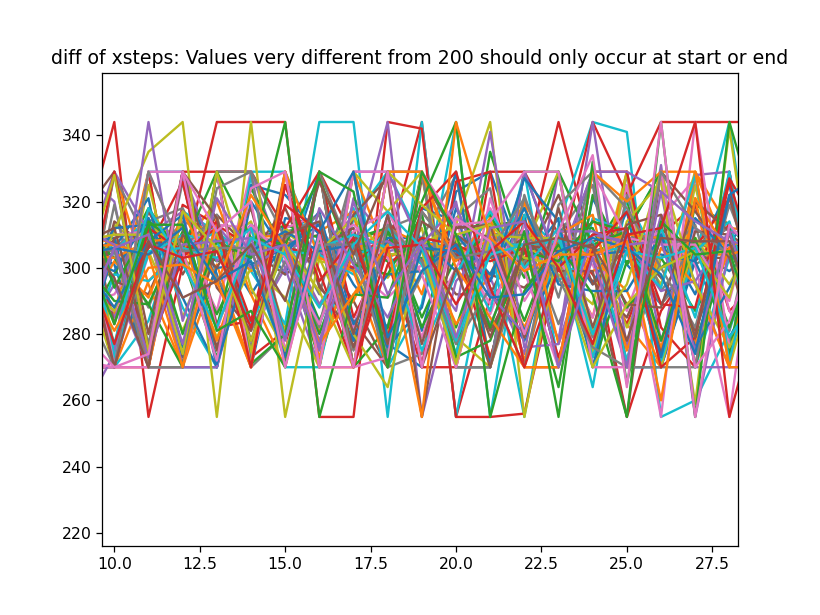

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3420: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3420: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3420: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Text(0.5, 1.0, 'diff of xsteps: Values very different from 200 should only occur at start or end')

In [11]:
# first PWC filtering
res={}
f,ax=plt.subplots(1,1)
for i,seg in enumerate(anlyz.segments):
    yfit, xsteps, ysteps = helperLibrary.straightLineFiltering(seg.data[anlyz.channelmap['wingDiff']], 0.020*anlyz.samplingRate, postEnhancement=True)
    res[i] = ysteps
    ax.plot(np.diff(xsteps))
ax.set_title('diff of xsteps: Values very different from 200 should only occur at start or end')

In [12]:
pureYvals = res

In [14]:
def central_diff_derivative(y, halfwidth=0.070, samplPeriod=0.020):
    """y is data to derivate, assumed to be np.array
    halfwidth and samplPeriod shall use the same unit (e.g. seconds)"""
    stepBack = int(halfwidth/samplPeriod+0.5)
    stepFwd = int(halfwidth/samplPeriod)
    return ( y[(stepFwd+stepBack):]-y[:-(stepBack+stepFwd)] )/((stepFwd+stepBack)*samplPeriod)

def lowPass(y, samplingRate):
    fThresh = 6.#Hz
    #b,a=signal.butter(5,6.,fs=samplingRate, btype='low')
    #ylow = signal.lfilter(b,a,y)
    b,a=signal.butter(5,6.*1.5,fs=samplingRate, btype='low')
    ylow = signal.filtfilt(b,a,y)
    return ylow

def central_diff_derivative(y, halfwidth=0.070, samplPeriod=0.020):
    """y is data to derivate, assumed to be np.array
    halfwidth and samplPeriod shall use the same unit (e.g. seconds)"""
    stepBack = int(halfwidth/samplPeriod+0.5)
    stepFwd = int(halfwidth/samplPeriod)
    return ( y[(stepFwd+stepBack):]-y[:-(stepBack+stepFwd)] )/((stepFwd+stepBack)*samplPeriod)

def highpass_data(y, samplingRate):
    # highpass data
    b,a = signal.butter(5, 1., fs=samplingRate, btype='high')
    yhigh = signal.lfilter(b,a,y)
    return yhigh

def plotHighLowPass(y, yhigh, ylow=None):
    f,ax=plt.subplots(1,1)
    ax.plot(y)
    ax.plot(yhigh)
    if not ylow is None:
        ax.plot(ylow)
    ax.legend(['original','highpass', 'lowpass'])
    return ax

def extractFlyStatistics(y, samplingRate, plot=True, **kwargs):
    yhigh = highpass_data(y, samplingRate)
    pdf, bins = np.histogram(yhigh, bins=50)
    pdf = pdf/pdf.sum()
    cdf = np.cumsum(pdf)
    thresh = kwargs.get('thresh',0.95)
    binCenters = (bins[:-1]+bins[1:])/2

    minIdx = np.argmin(np.abs(cdf-thresh))
    theta = binCenters[minIdx]
    
    if plot:
        f,ax=plt.subplots(1,1)
        ax.plot(binCenters, pdf)
        ax.plot(binCenters, cdf)
        ax.plot(binCenters[minIdx],cdf[minIdx], 'go')
        ax.plot(binCenters[minIdx],pdf[minIdx], 'ro')
        ax.axhline(0.9, color='k', linestyle=':')
        ax.axvline(theta, color='r')
    return theta

def detectPeaks(theta, ydiff):
    detectTheta = theta*6. #as stated in paper
    peaksFound = signal.find_peaks(np.abs(ydiff), height=detectTheta)
    return peaksFound

def plotDetection(ax,ydiff, detectTheta):
    #ax=plt.gca()
    #ax.plot(np.abs(ydiff))
    ax.plot(ydiff)
    ax.axhline(detectTheta, color='k')    
    ax.axhline(0, color='g')
    
# find peak times
def findPeakTimes(ydiff, peaksFound):
    ## for each peak, move FORWARD till encountering closest to 0
    peakTime = np.full_like(peaksFound, np.nan, dtype=int)
    for j,p in enumerate(peaksFound):
        #compare the signs, because peaks can be + or - (at 0 it switches)
        sameSign = True
        i=0
        while sameSign>0:
            i+=1
            if p+i >=ydiff.size:
                i -=1 #plug right value for line after while loop
                break
            sameSign = (ydiff[p+i]*ydiff[p+i-1])>0. 
        if p+i <ydiff.size:
            thisPeak = p+i-1 + np.argmin(np.abs(ydiff[[p+i-1,p+i]]))
        else:
            thisPeak = ydiff.size
        #print(ydiff[[p+i-1,p+i]])
        #print(thisPeak)
        peakTime[j] = int(thisPeak)
    return peakTime

# find onset times
def findOnsetTime(ydiff, peaksFound):
    ## for each peak, move BACKWARD till encountering closest to 0
    onsetTime = np.zeros_like(peaksFound, dtype=int)
    for j,p in enumerate(peaksFound):
        sameSign = True
        i=-0
        while sameSign>0:
            i-=1
            if p+i<0:
                i+=1 #plug right value for line after while loop
                break
            sameSign = (ydiff[p+i]*ydiff[p+i+1])>0. #compare the signs, because peaks can be + or - (at 0 it switches)
        if p+i >=0:
            thisOnset = p+i + np.argmin(np.abs(ydiff[[p+i,p+i+1]]))
        else:
            thisOnset=0
        #print(ydiff[[p+i,p+i+1]])
        #print(thisOnset)
        onsetTime[j] = int(thisOnset)
    return onsetTime

# correct onset times for error introduced by lowpass filtering
def correctOnsetTime(y,ylow, ydiff, peaksFound, onsetTime):
    actualOnset = np.full_like(onsetTime, np.nan, dtype=int)
    for j,o in enumerate(onsetTime):
        ## use value of low-passed L-R WBA at putative onset as threshold
        thresh = ylow[o]
        ## look forward in original signal from putative onset and find last sample before threshold
        ytemp = y-thresh #this turns it into finding a 0-crossing (like above)
        ### shortcut to deal with cases where actual onset is not included in trace
        p = peaksFound[j]
        if not any(np.diff(np.sign(ytemp[o:p]))):
            #no change in sign means no threshold crossing
            actualOnset[j] = o #keep putataive one
            continue
        sameSign=True
        i=0
        while sameSign:
            i+=1
            #sameSign = (ydiff[o+i]*ydiff[o+i-1])>0.
            sameSign = (ytemp[o+i]*ytemp[o+i-1])>0.
        ## define this as actual onset
        actualOnset[j] = o+1-1
    return actualOnset

## get saccade amplitudes
def getSaccadeAmplitude(y, peaksFound, actualOnset, samplingRate):
    #subtracted the mean L-R WBA signal 50-ms baseline interval before saccade onset 
    #from mean L-R WBA signal in +-15-ms windows surrounding the peak
    saccAmp = np.full(peaksFound.size, np.nan, dtype=np.float)
    for i in range(len(actualOnset)):
        baseline = np.mean(y[actualOnset[i]-int(0.06*samplingRate) : actualOnset[i]])
        if not np.isnan(baseline):
            #saccAmp[i] =  np.mean( y[peaksFound[i]-int(0.03*samplingRate) : peaksFound[i]+int(0.03*samplingRate)+1] ) - baseline    
            saccAmp[i] =  np.mean( y[peaksFound[i]-int(0.03*samplingRate) : peaksFound[i]+int(0.03*samplingRate)] ) - baseline    
    return saccAmp

def plotPeaks(y, actualOnset, peakTime, saccAmp, ax=None):
    if ax is None:
        f,ax=plt.subplots(1,1)
        ax.plot(y)
    ax.plot(actualOnset, y[actualOnset], 'r>')
    ax.plot(peakTime, y[peakTime], 'k^')
    ax.plot(peakTime, saccAmp, 'ko')
    return

# eliminate putative saccade if maximal deviation before onset is>55% of amplitude
def eliminateByDeviation(y, actualOnset, saccAmp, samplingRate, **kwargs):
    window = kwargs.get('window',0.201)
    deviationLimit = kwargs.get('deviationLimit',0.55)
    toEliminate = []
    for i in range(actualOnset.size):
        # preselect to make sure the indexing is feasible
        #baseline = np.mean(y[actualOnset[i]-int(0.2*samplingRate) : actualOnset[i]])
        chunk = y[actualOnset[i]-int(window*samplingRate) : actualOnset[i]]
        if actualOnset[i]-int(window*samplingRate) <0:
            toEliminate.append(i)
            continue
        deviation = chunk.max()-chunk.min()
        if deviation>deviationLimit*abs(saccAmp[i]):
            toEliminate.append(i)
    return toEliminate


In [15]:
anlyz.kineflyPeriod = 0.02

In [16]:
# get a random sample of trials to plot (visually inspect)
plotIdx = sorted(np.random.choice(np.arange(anlyz.segments.size), 8, replace=False))
plotIdx=np.append(plotIdx, anlyz.segments.size)#append a number that will never be reached later
#plotIdx=np.array([0,1,2,3,4,5,6,7,500])
plotIdx

array([ 9, 15, 16, 36, 42, 65, 68, 73, 77])

The results from using central difference look best, without enabling anything that is impossible in another way. Can keep this approach for later comparison.

<IPython.core.display.Javascript object>


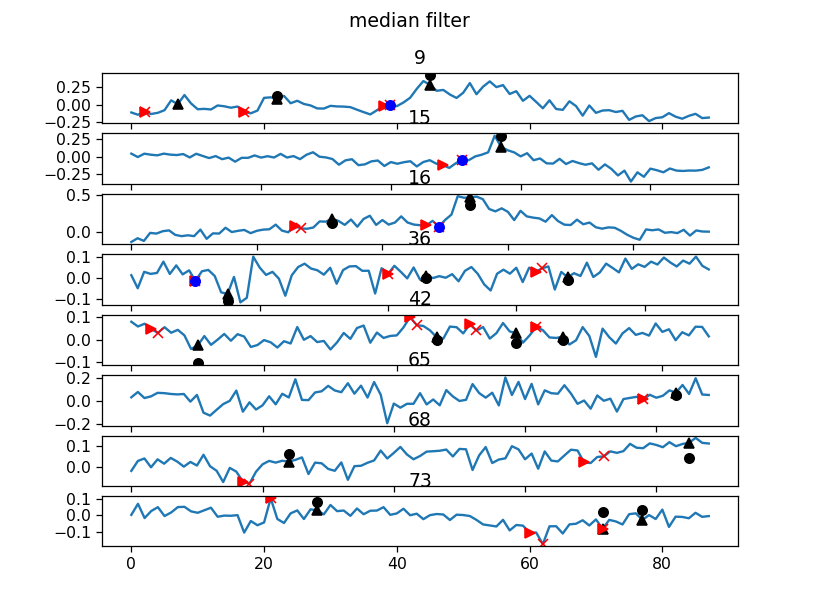

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:144: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:44: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3420: RuntimeWarning: Mean of empty slice.
  out=

Text(0.5, 0.98, 'median filter')

In [21]:
#scales = 2.**np.arange(0, 4, 1./16.)
saccDataCWT = {}
# these parameters should not be changed lightly
scales = 2.**np.arange(2, 3., 1./16.)
diff_half_width = 0.05
medianFilterWidth = 3
cwtpeaks_window_size = 15
deviationWindow = 0.16
deviationLimit = 0.65

#f,ax=plt.subplots(5,2)
f,ax=plt.subplots(8,1)
ax=ax.reshape(-1,1)
#start=0
pltix=0
#for i in range(start,start+5):
for i in range(anlyz.segments.size):
#for i in [0]:
    y=pureYvals[i]
    detectSignal = signal.medfilt(y,medianFilterWidth)
    #detectSignal=np.diff(detectSignal)
    detectSignal = central_diff_derivative(detectSignal, diff_half_width, 0.02)
    # slight modification for experimental trials
    if anlyz.group_indices[i] in range(3,6):
        detectSignal = -detectSignal
    peaks = signal.find_peaks_cwt(detectSignal, scales, gap_thresh=1, window_size=cwtpeaks_window_size, noise_perc=5)
    #peaks2 = signal.find_peaks_cwt(-detectSignal, scales, gap_thresh=1, window_size=20, noise_perc=5)
    #peaks = np.concatenate((peaks,peaks2))
    peaks = peaks.astype('int')
    #peaks = signal.find_peaks_cwt(y, scales, gap_thresh=3)
    #c,fs = pywt.cwt(y, scales, 'mexh', sampling_period=0.02)
    c,fs = pywt.cwt(detectSignal, scales, 'mexh', sampling_period=0.02)

    #peakTime = findPeakTimes(np.diff(signal.medfilt(y,5)), peaks)
    peakTime = findPeakTimes(detectSignal, peaks)+int(diff_half_width/anlyz.kineflyPeriod)
    #onsetTime = findOnsetTime(np.diff(signal.medfilt(y,5)), peaks)
    onsetTime = findOnsetTime(np.diff(signal.medfilt(y,medianFilterWidth)), peaks)
    saccAmp = getSaccadeAmplitude(y, peakTime, onsetTime, 1/anlyz.kineflyPeriod)
    #print(saccAmp)

    #elimiate if it could be a return after saccade
    elim = eliminateByDeviation(y, onsetTime, saccAmp, 1/anlyz.kineflyPeriod, 
                                window=deviationWindow, deviationLimit=deviationLimit)    
    keep = np.ones_like(peaks,dtype=np.bool)
    keep[elim]=False
    #eliminate if not around general time of max lom -> DONE IN NEXT CELL
    #endLoom = int(round(anlyz.preStim/anlyz.kineflyPeriod)+anlyz.stimulusPhases_inframes[1])
    #elim = np.logical_or(peaks<endLoom-6, endLoom+2<peaks )
    #keep[elim]=False
    #print(sum(keep))
    
    theta = extractFlyStatistics(y, 1/anlyz.kineflyPeriod, plot=False)
    #print(theta)

    if i==plotIdx[pltix]:
        ax[pltix,0].plot(y)
        #ax[i-start,0].plot(detectSignal)
        ax[pltix,0].plot(peaks, y[peaks], 'rx')
        #ax[i-start,0].plot(peaks, detectSignal[peaks], 'kx')
        #im=ax[i-start,1].pcolormesh(c)
        #im.set_clim([-0.5,0.5])

        ax[pltix,0].plot(peakTime, y[peakTime], 'k^')
        ax[pltix,0].plot(onsetTime, y[onsetTime], 'r>')
        ax[pltix,0].plot(peakTime, saccAmp, 'ko')
        ax[pltix,0].plot(peaks[keep], y[peaks[keep]], 'o',color='b',markerfacecolor=None)
        ax[pltix,0].set_title(plotIdx[pltix])
        pltix += 1

    peaks = peaks[keep]
    peakTime = peakTime[keep]
    onsetTime = onsetTime[keep]
    saccAmp = saccAmp[keep]
    
    saccDataCWT[i] = dict([('peakTime',peakTime),('onset',onsetTime), ('saccAmp',saccAmp), ('CWTpeaks',peaks)])
detectionParams = {'method':'CWT',
                  'scales': scales,
                  'diff_half_width': diff_half_width,
                  'medianFilterWidth': medianFilterWidth,
                  'CWTpeaks_window_size':cwtpeaks_window_size,
                   'deviationWindow':deviationWindow,
                   'deviationLimit': deviationLimit
                  }
f.suptitle('median filter')

In [22]:
# next, check if it's around the time of max-loom
saccDataCWT_filtered = {}
detectionParams['framesBeforeMaxLoom'] = 10
detectionParams['framesAfterMaxLoom'] = 3
for i,seg in saccDataCWT.items():
    maxloom = round(anlyz.preStim/anlyz.meanFramePeriod)+anlyz.stimulusPhases_inframes[1]
    #idx = [i for i in range(len(seg['CWTpeaks'])) if seg['CWTpeaks'][i] in range(maxloom-6,maxloom+2)]
    idx = [i for i in range(len(seg['CWTpeaks'])) if seg['CWTpeaks'][i]
           in range(maxloom-detectionParams['framesBeforeMaxLoom'],maxloom+detectionParams['framesAfterMaxLoom'])]
    if len(idx)>1:
        idx = [idx[-1]]
    saccDataCWT_filtered[i] = {k:v[idx] for k,v in seg.items()}
    

<IPython.core.display.Javascript object>


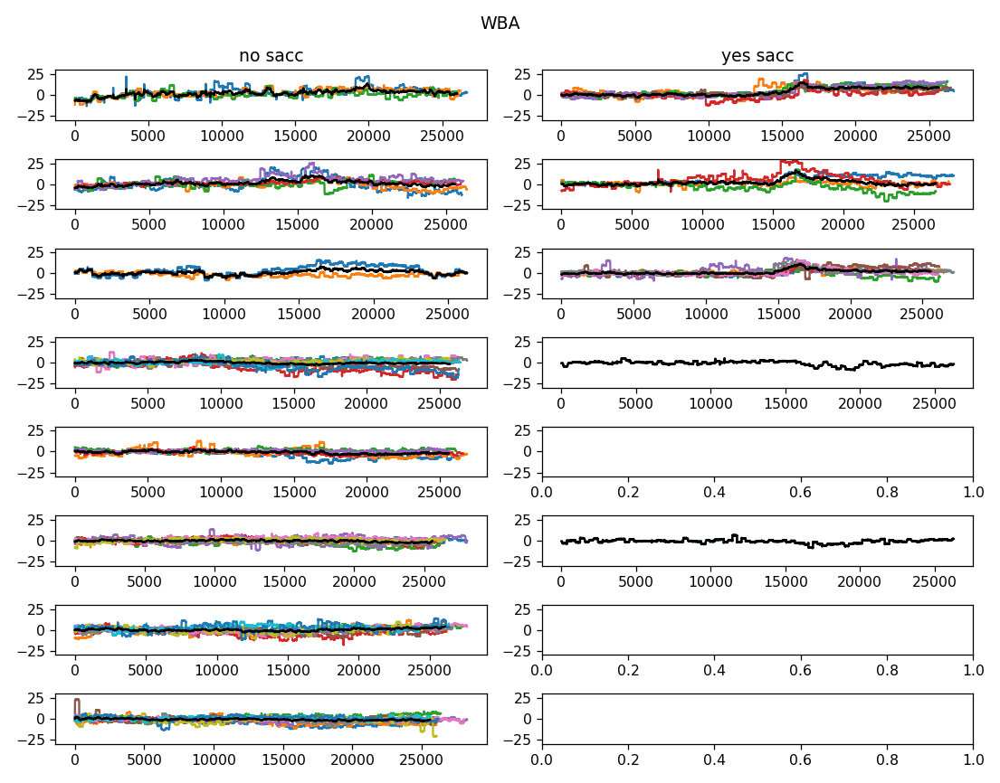

In [23]:
f,ax=plt.subplots(8,2)
f.suptitle('WBA')
ax[0,0].set_title('no sacc')
ax[0,1].set_title('yes sacc')
for i in saccDataCWT_filtered:
    ax[anlyz.group_indices[i],len(saccDataCWT_filtered[i]['peakTime'])].plot(anlyz.segments[i].data[-1]*180./np.pi)
    
for a in ax.flatten():
    d=[l.get_data()[1] for l in a.get_children() if isinstance(l, plt.Line2D) ]
    try:
        minLen = min([len(x) for x in d])
    except ValueError:#happens when min() of empty list
        continue
    a.plot(np.mean(np.array([x[:minLen] for x in d]),axis=0), 'k-')

In [24]:
[a.set_ylim([-30,30]) for a in ax.flatten()]
plt.tight_layout()

<IPython.core.display.Javascript object>


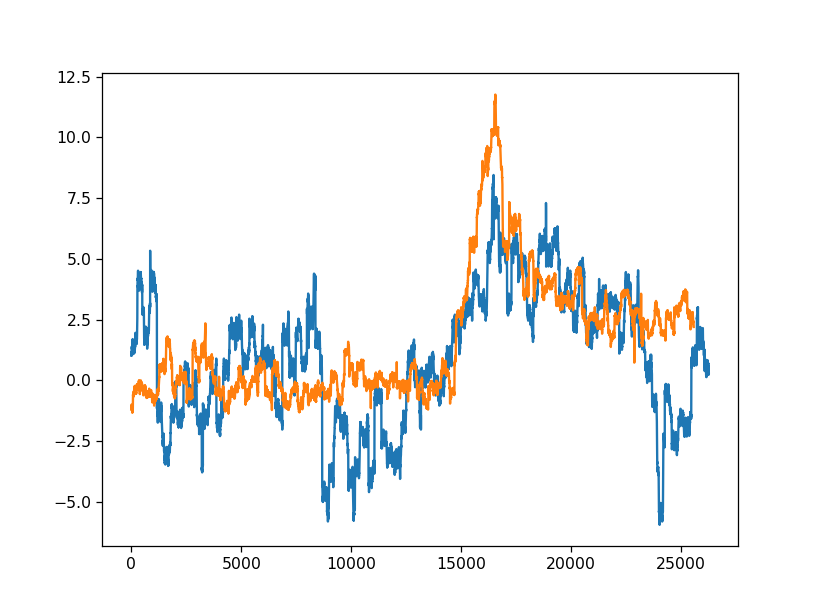

(2, 26260) (8, 25575)


In [25]:
gid=2
f,ax=plt.subplots(1,1)
#ax[0,0].set_title('no sacc')
#ax[0,1].set_title('yes sacc')
y = []
n =[]
ny = [n,y]
for i in saccDataCWT_filtered:
    if anlyz.group_indices[i]!=gid:
        continue
    ny[len(saccDataCWT_filtered[i]['peakTime'])].append(anlyz.segments[i].data[-1]*180./np.pi)
    #ny[len(saccDataCWT_filtered[i]['peakTime'])].append(anlyz.segments[i].data[0]*100)
minLen = min([len(d) for d in n])
n = np.array([d[:minLen] for d in n])
minLen = min([len(d) for d in y])
y = np.array([d[:minLen] for d in y])
print(n.shape, y.shape)
ax.plot(np.average(n, axis=0))
ax.plot(np.average(y, axis=0))



<IPython.core.display.Javascript object>


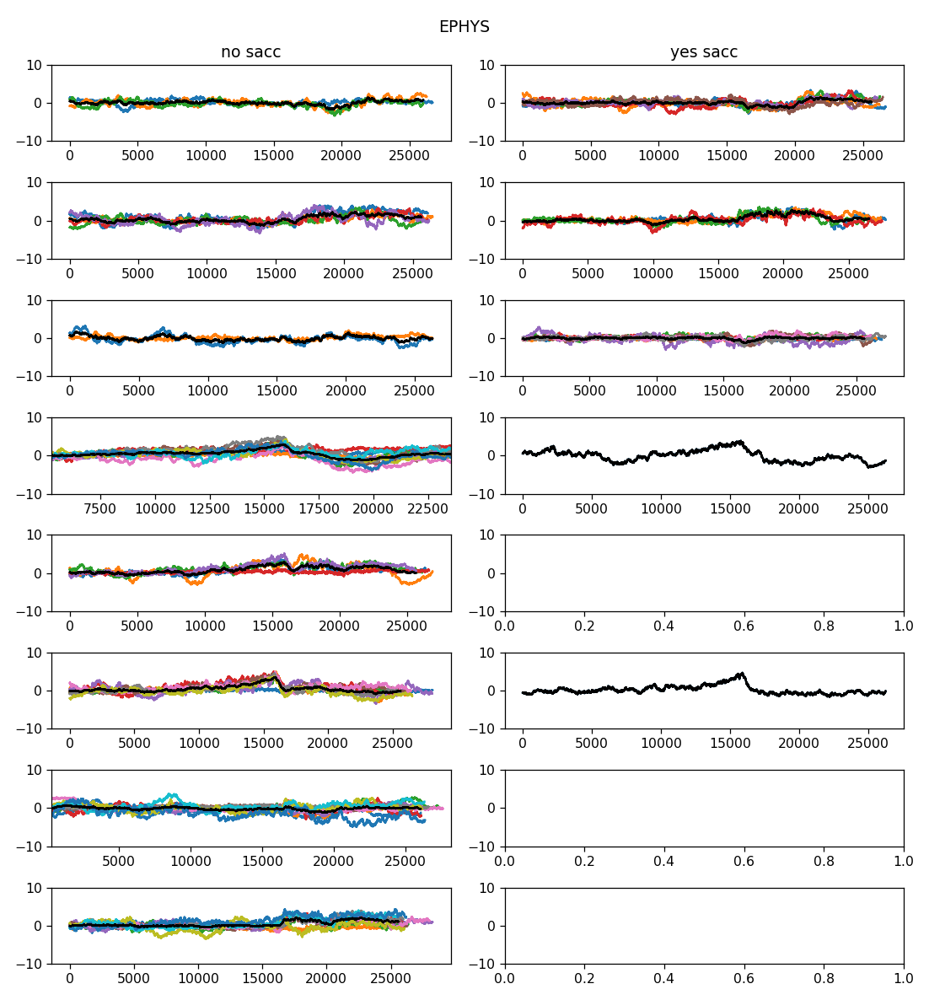

In [26]:
f,ax=plt.subplots(8,2)
f.suptitle('EPHYS')
ax[0,0].set_title('no sacc')
ax[0,1].set_title('yes sacc')
for i in saccDataCWT_filtered:
    ax[anlyz.group_indices[i],len(saccDataCWT_filtered[i]['peakTime'])].plot(anlyz.segments[i].data[0]*100)
    
for a in ax.flatten():
    d=[l.get_data()[1] for l in a.get_children() if isinstance(l, plt.Line2D) ]
    try:
        minLen = min([len(x) for x in d])
    except ValueError:#happens when min() of empty list
        continue
    a.plot(np.mean(np.array([x[:minLen] for x in d]),axis=0), 'k-')

In [27]:
[a.set_ylim([-10,10]) for a in ax.flatten()]
plt.tight_layout()

In [71]:
nameroot = 'saccRight_DePol'

## split saccading <-> non-saccading
Similar to splitting flying and resting

In [2]:
saFly = anlyz #we tossed names around earlier

NameError: name 'anlyz' is not defined

In [74]:
#doesSaccade
doesSaccade = np.array([len(v['CWTpeaks']) for _,v in saccDataCWT_filtered.items()]).astype(bool)

In [75]:
'''split the present Analyzer class into two new classes, one containing the trials where animal is doing a saccade, the others where not
Assumes that the sorting saccade/unreactive has already happened, using e.g. remove_dud_gui()'''
import copy
saSaccade = copy.copy(saFly)
saStraight = copy.copy(saFly)
saStraight.remove_duds_byList( np.where(doesSaccade)[0])
saSaccade.remove_duds_byList( np.where(np.logical_not(doesSaccade))[0])


In [76]:
print(saFly.segments.size, saFly.group_indices.size)
print(saSaccade.segments.size, saSaccade.group_indices.size)
print(saStraight.segments.size, saStraight.group_indices.size)

373 373
136 136
237 237


In [77]:
saSaccade.segments.size+saStraight.segments.size==saFly.segments.size #just make sure...

True

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


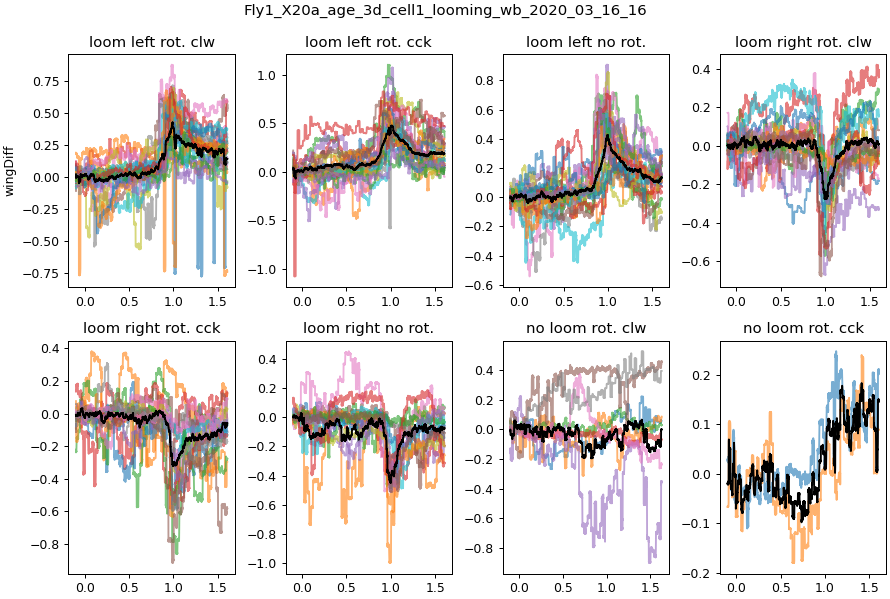

In [78]:
saSaccade.average_flywise()
saSaccade.plot_by_stimSignal('wingDiff')

<IPython.core.display.Javascript object>


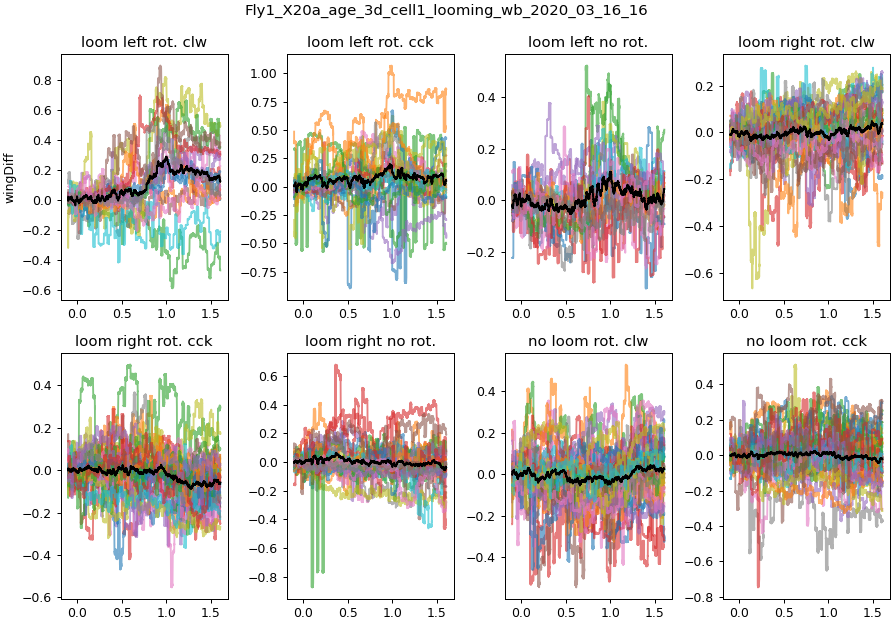

<IPython.core.display.Javascript object>

In [79]:
#saStraight.average_flywise()
saStraight.average_by_stimSignal()
saStraight.plot_by_stimSignal('wingDiff')

## Neo file

In [80]:
nameParticle = 'saccRight_DePol__CWTdetection'

In [81]:
#froot = os.getcwd()
froot = os.path.join(DATAPATH,'Collections_saccade_straight')
saSaccade.write2neomatfile(os.path.join(froot, nameParticle+'_saccading'+'.neomat'))
saStraight.write2neomatfile(os.path.join(froot, nameParticle+'_straight'+'.neomat'))

In [126]:
saSaccade.flyID

{0: 'fly1_WTCS_20180725_cell1',
 1: 'fly1_WTCS_20190213_cell1',
 2: 'fly1_WTCS_20190726_cell1'}

# Alternative approaches

## Detect saccades using gaussian filter and derivative

Detect saccades around the time when looming is maximal

First try this way: gaussian low-pass filtering the wingDiff, then putting a threshold relative to a moment shortly before the stimulus is very large

On the way there I developed other algorithms that I am more satisfied with

In [99]:
theta = 0.25
thetaDiff = 0.0002
timeWin=0.1
f,ax=plt.subplots(2,1)
doesSaccade=np.zeros(saFly.segments.size, dtype=np.bool)
endLoomFrame = saFly.stimulusPhases_inframes[1]
for i in range(0,saFly.segments.size,1):
    d = saFly.segments[i].data[saFly.channelmap['wingDiff']]#wingDiff
    if saFly.group_indices[i]>2: #for loom from left, invert
        d=-d
    df = ndimage.gaussian_filter1d(d, 1.*saFly.meanFramePeriod*saFly.samplingRate)

    endOfLoom = int((saFly.preStim +saFly.meanFramePeriod*saFly.stimulusPhases_inframes[1])*saFly.samplingRate) #forgot the prestim earlier
    #midOfLoom = endOfLoom//3*2 #at 2/3 of stim
    midOfLoom = endOfLoom-int(2*timeWin*saFly.samplingRate)

    valMidOfLoom = np.mean(d[midOfLoom-1000:midOfLoom+1000])
    ddf = np.diff(df)
    #doesSaccade[i] = any( df[int(endOfLoom-0.1*saFly.samplingRate):int(endOfLoom+0.12*saFly.samplingRate)] >(valMidOfLoom+theta))
    #doesSaccade[i] = any( df[int(endOfLoom-0.1*saFly.samplingRate):int(endOfLoom+0.12*saFly.samplingRate)] >valMidOfLoom+theta) and (ddf.argmax() in range(int(endOfLoom-0.1*saFly.samplingRate), int(endOfLoom+0.1*saFly.samplingRate)))
    #doesSaccade[i] = any( df[int(endOfLoom-timeWin*saFly.samplingRate):int(endOfLoom+timeWin*saFly.samplingRate)] >(valMidOfLoom+theta)) and (any(ddf[int(endOfLoom-timeWin*saFly.samplingRate):int(endOfLoom+timeWin*saFly.samplingRate)]>thetaDiff))
    doesSaccade[i] = any(ddf[int(endOfLoom-(timeWin)*saFly.samplingRate):int(endOfLoom+timeWin/2*saFly.samplingRate)]>thetaDiff)
    ax[0].plot(d)
    ax[0].plot(df)
    ax[1].plot(ddf)
    ax[1].plot(ax[1].get_xlim(),[thetaDiff,thetaDiff],'k:')
    ax[0].plot([midOfLoom,midOfLoom], ax[0].get_ylim(),'y:')
    ax[0].plot([endOfLoom-(timeWin)*saFly.samplingRate,endOfLoom-(timeWin)*saFly.samplingRate], ax[0].get_ylim(),'k:')
    ax[0].plot([endOfLoom+timeWin/2*saFly.samplingRate,endOfLoom+timeWin/2*saFly.samplingRate], ax[0].get_ylim(),'k:')
    ax[0].set_title(i)
    if doesSaccade[i]:
        ax[0].plot(ax[0].get_xlim(), [valMidOfLoom+theta,valMidOfLoom+theta], 'g')
    else:
        ax[0].plot(ax[0].get_xlim(), [valMidOfLoom+theta,valMidOfLoom+theta], 'r')
    #plt.waitforbuttonpress()
    ax[0].clear()
    ax[1].clear()
    

In [98]:
# double check to see classification accuracy
f,ax=plt.subplots(1,2)
ax[0].set_title('yes saccade')
ax[1].set_title('no saccade')
#for i in range(doesSaccade.size):
for i in range(0,len(doesSaccade)):
#for i in range(10,11):
    if doesSaccade[i]:
        ax[0].clear()
        ax[0].plot(saFly.segments[i].data[[0,-1],:].T)
        ax[0].set_title(str(i))
    else:
        ax[1].clear()
        ax[1].plot(saFly.segments[i].data[[0,-1],:].T)
        ax[1].set_title(str(i))
    #plt.waitforbuttonpress()
    plt.pause(0.25)
        

In [200]:
# PLOT A COLLECTIVE OVERVIEW OF TRIALS WITH DETECTED SACCADES
f,ax=plt.subplots(2,2)
ax=ax.flatten()

#for i,seg in enumerate(saFly.segments):
#    if saFly.group_indices[i]<3 and doesSaccade[i]:
#        ax[0].plot(seg.data[-1])
[ax[0].plot(seg.data[-1], alpha=0.4, linewidth=1) for i,seg in enumerate(saFly.segments) if saFly.group_indices[i]<3 and doesSaccade[i] ]
[ax[1].plot(seg.data[-1], alpha=0.4, linewidth=1) for i,seg in enumerate(saFly.segments) if saFly.group_indices[i]<3 and not doesSaccade[i] ]
[ax[2].plot(seg.data[-1], alpha=0.4, linewidth=1) for i,seg in enumerate(saFly.segments) if 2<saFly.group_indices[i]<6 and doesSaccade[i] ]
[ax[3].plot(seg.data[-1], alpha=0.4, linewidth=1) for i,seg in enumerate(saFly.segments) if 2<saFly.group_indices[i]<6 and not doesSaccade[i] ]


[[<matplotlib.lines.Line2D at 0x1b51c4db648>],

In [31]:
## Betinnas Gaussian myFilter
myFilter=np.exp(-(np.arange(-0.2*saFly.samplingRate,0.2*saFly.samplingRate+1)**2.)/(20.*saFly.samplingRate))
myFilter /= myFilter.sum()
dfilt=[None]*saFly.segments.size
for i in range(0,saFly.segments.size):
    dfilt[i] = np.convolve(saFly.segments[i].data[-1],myFilter,'same')

threshold = 0.15;
doesSaccade = np.zeros(len(dfilt), dtype=np.bool)
for i in range(len(dfilt)):
    amplitude = np.abs(np.mean(dfilt[i][int(0.99*saFly.samplingRate):int(1.*saFly.samplingRate)]) -np.mean(dfilt[i][int(0.75*saFly.samplingRate):int(0.9*saFly.samplingRate)]) )
    if amplitude >threshold:
        doesSaccade[i] = True
    else:
        doesSaccade[i] = False


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


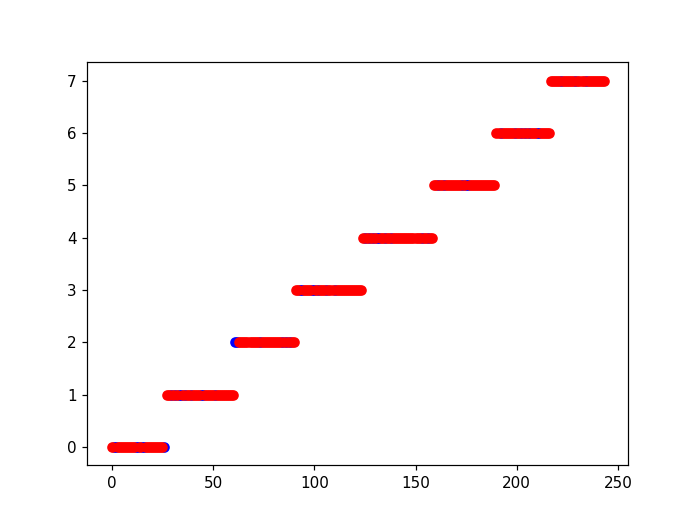

"f,ax=plt.subplots(1,1)\nax.plot(np.where(saccades)[0], saFly.group_indices[saccades], 'bo')\nax.plot(np.where(np.logical_not(saccades))[0], saFly.group_indices[np.logical_not(saccades)], 'ro')"

In [32]:
f,ax=plt.subplots(1,1)
ax.plot(np.where(doesSaccade)[0], saFly.group_indices[doesSaccade], 'bo')
ax.plot(np.where(np.logical_not(doesSaccade))[0], saFly.group_indices[np.logical_not(doesSaccade)], 'ro')
'''f,ax=plt.subplots(1,1)
ax.plot(np.where(saccades)[0], saFly.group_indices[saccades], 'bo')
ax.plot(np.where(np.logical_not(saccades))[0], saFly.group_indices[np.logical_not(saccades)], 'ro')'''

<IPython.core.display.Javascript object>


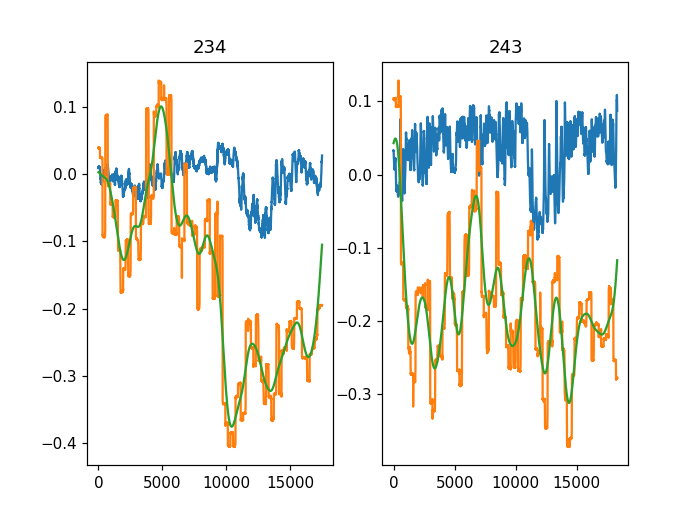

In [33]:
# double check to see classification accuracy
f,ax=plt.subplots(1,2)
ax[0].set_title('yes saccade')
ax[1].set_title('no saccade')
for i in range(saccades.size):
    if doesSaccade[i]:
        ax[0].clear()
        ax[0].plot(saFly.segments[i].data[[0,-1],:].T)
        ax[0].plot(dfilt[i])
        ax[0].set_title(str(i))
    else:
        ax[1].clear()
        ax[1].plot(saFly.segments[i].data[[0,-1],:].T)
        ax[1].plot(dfilt[i])
        ax[1].set_title(str(i))
    #plt.waitforbuttonpress()
    plt.pause(0.5)
        

## PCA version for classifying saccades

Straight line filtering works ok and could be useful, but doing a pca on it afterwards seems pointless at first

**However** it starts to make sense when using all stimulus groups for the PCA, since that icreases the variability of the behavior when stimulus appears, whereas before, the behavior can be thought of as relatively stereotyped (looming left => escape right)

Do a PCA on all the stimulus types jointly, then reconstruct using limited dimensions, then we can operate some more on this.
E.g. differentiating Srec, z-scoring the differential, averaging with a gaussian window.

In [333]:
sumAnlyz=saFly
#saFly=sumAnlyz
detectionComparison = {}

NameError: name 'saFly' is not defined

Perform straight line filtering on all the wingDiffs of a certain stimulus group. Keep only the ystep values, don't care about precise timing

In [32]:
allSizes = np.array([seg.data.shape[1] for seg in sumAnlyz.segments])
print(sum(allSizes>20000))
print(sum(allSizes<20000))
print(allSizes.size)

NameError: name 'sumAnlyz' is not defined

In [297]:
f,ax=plt.subplots()
ax.plot(sumAnlyz.group_indices)

In [298]:
allSrate = np.array([seg.samplingRate for seg in sumAnlyz.segments])
print(sum(abs(allSrate-15000)<20))
print(sum(abs(allSrate-10000)<20))
print(allSrate.size)

185
290
475


**have a few variables keep track of order**

By default, the segments inside the Analyzer class are sorted by stimulus type. But make sure to have a copy to keep track of it

In [129]:
class BackupOrdering():
    def backupOrder(self, anlyz):
        self.group_indices = anlyz.group_indices.copy()#
        self.fly_indices = anlyz.fly_indices.copy()
        self.samplingRates = np.array([seg.samplingRate for seg in anlyz.segments])
        self.allSizes = np.array([seg.data.shape[1] for seg in anlyz.segments])
        self.metadata = anlyz.metadata
        self.flyID = anlyz.flyID
        
        
BAKORDER = BackupOrdering()
BAKORDER.backupOrder(sumAnlyz)

In [33]:
# simply do them in a row, the way they are sorted inside the Analyzer class
pureYvals = []
#mse=np.full(sumAnlyz.segments.size, -1.)
for i,seg in enumerate(sumAnlyz.segments):
    srate = seg.samplingRate
    print(i,srate)
    _,_,temp = helperLibrary.straightLineFiltering(seg.data[-1], 0.02*srate, postEnhancement=True)
    #mse[i] = np.mean((seg.data[-1]-yfit)**2)
    pureYvals.append(temp)


NameError: name 'sumAnlyz' is not defined

Previous way requires us to take care of the pureYvals ourselves.

To see if everyhing went ok, look at some of the worst fits (high MSE). Turns it tese are mostly just those wih a lot of electrical noise.

<IPython.core.display.Javascript object>


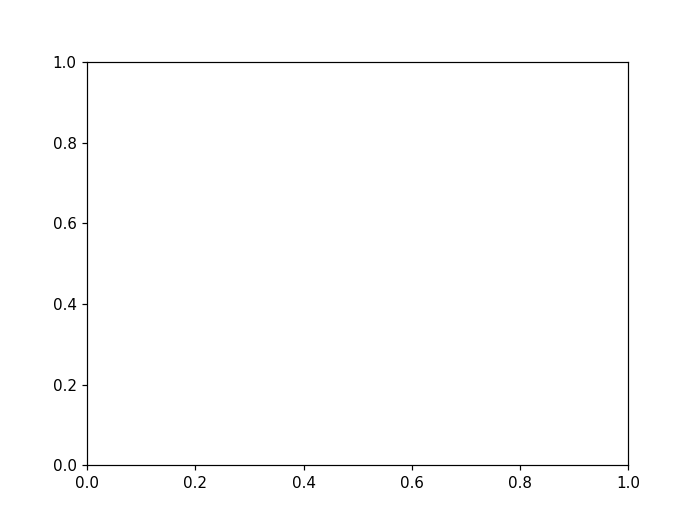

NameError: name 'mse' is not defined

In [66]:
f,ax=plt.subplots(1,1)
#ssq=[np.sum((yfitRes[i]-sumAnlyz.segments[i].data[-1])**2) for i in range(sumAnlyz.segments.size)]
ax.plot(mse,'kx')
lookAt = np.where(mse>0.0025)[0]
print(len(lookAt))
f,ax=plt.subplots(4,6)
ax=ax.flatten()
for i,id in enumerate(lookAt):
    ax[i].plot(sumAnlyz.segments[id].data[-1])
    ax[i].plot(yfitRes[id])

In [34]:
#BAKORDER.pureYvals = pureYvals.copy()#backing up seemes superfluous by now
minLen = min([yv.size for yv in pureYvals])

f,ax=plt.subplots(1,1)
ax.hist([yv.size for yv in pureYvals], bins=np.arange(80,110,1)-0.5)
ax.set_title('fitted y segments lengths')

pureYvals = np.array([yv[:minLen] for yv in pureYvals])
ax.hist([yv.size for yv in pureYvals], bins=np.arange(80,110,1)-0.5)

pureYvals.shape

ValueError: min() arg is an empty sequence

In [1]:
# plots the result as divergent color image
f,ax=plt.subplots(1,1)
im=ax.pcolormesh(pureYvals, cmap=plt.get_cmap('bwr'))
plt.colorbar(im)
im.set_clim([-1,1])

NameError: name 'plt' is not defined

Do a PCA on this data, because it is reduced a lot in original dimensionality. That should makeit more reliable

In [35]:
def decompose(X):
    X = X.astype(np.float32)
    #print(X.shape)
    #f,ax=plt.subplots(1,1)
    #ax.plot(wingDiff[0,::4])
    #ax.plot(X[0])
    X = X-X.mean(axis=0)
    covmat = 1/ X.shape[0] * X.T @ X
    #print(covmat.shape)
    #Decomposition
    evals, evectors = np.linalg.eigh(covmat)
    return evals, evectors

def sort_pca_dims(evals, evectors):
    sortidx = np.argsort(evals)[::-1]
    evalsSort = evals[sortidx]
    evecSort = evectors[:,sortidx]
    return evalsSort, evecSort
    
def get_pca_transform(X, sort=True):
    evals, evectors = decompose(X)
    if sort:
        evals, evectors = sort_pca_dims(evals, evectors)
    S = X @ evectors
    return S, evals, evectors

In [36]:
minLen = min([v.size for _,v in pureYvals.items()])
y = np.array([v[:minLen] for _,v in pureYvals.items()])

AttributeError: 'list' object has no attribute 'items'

In [73]:
# DO PCA ON DATA AND LOOK AT RESULT
#S,evals,evecs = get_pca_transform(pureYvals)
S,evals,evecs = get_pca_transform(y)

<IPython.core.display.Javascript object>


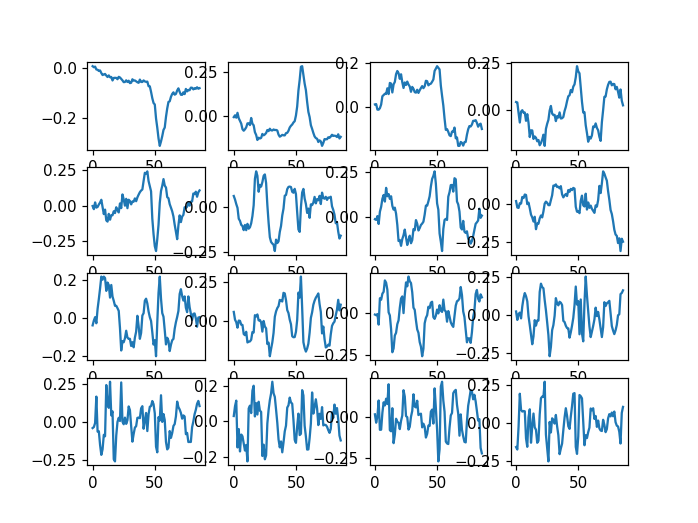

In [74]:
# LOOK AT THE FIRST EIGENVECTORS
f,ax=plt.subplots(4,4)
ax=ax.flatten()
for i in range(16):
    ax[i].plot(evecs[:,i])

<IPython.core.display.Javascript object>


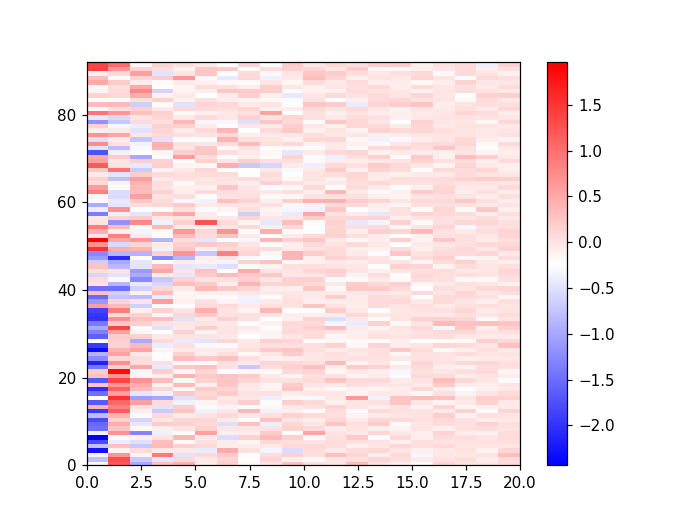

In [75]:
# plots the result as divergent color image
f,ax=plt.subplots(1,1)
im=ax.pcolormesh(S[:,:20], cmap=plt.get_cmap('bwr'))
plt.colorbar(im)
#im.set_clim([-1,1])

#### alternative route: load eigenvectors from file

In [51]:
#np.savez('D:/RecorderData/PCA_dimensions', evecs,evals)
with np.load('D:/RecorderData/PCA_dimensions.npz') as data:
    evecs=data['arr_0']
    evals=data['arr_1']

In [52]:
# simply do them in a row, the way they are sorted inside the Analyzer class
pureYvals = []
#yfitRes = []
mse=np.full(sumAnlyz.segments.size, -1.)
for i,seg in enumerate(sumAnlyz.segments):
    srate = seg.samplingRate
    yfit,_,temp = helperLibrary.straightLineFiltering(seg.data[-1], 0.02*srate, postEnhancement=True)
    mse[i] = np.mean((seg.data[-1]-yfit)**2)
    pureYvals.append(temp)
    #yfitRes.append(yfit)

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3420: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:188: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [53]:
minLen=min([len(py) for py in pureYvals])
X=np.array([py[:minLen] for py in pureYvals])
S = X @ evecs

<IPython.core.display.Javascript object>


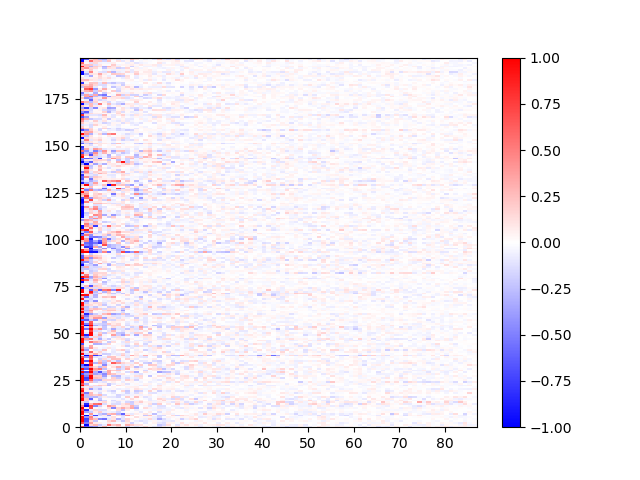

In [54]:
f,ax=plt.subplots(1,1)
im =ax.pcolormesh(S, cmap=plt.get_cmap('bwr'))
plt.colorbar(im)
im.set_clim([-1,1])


Visualize the first dimensions:

<IPython.core.display.Javascript object>


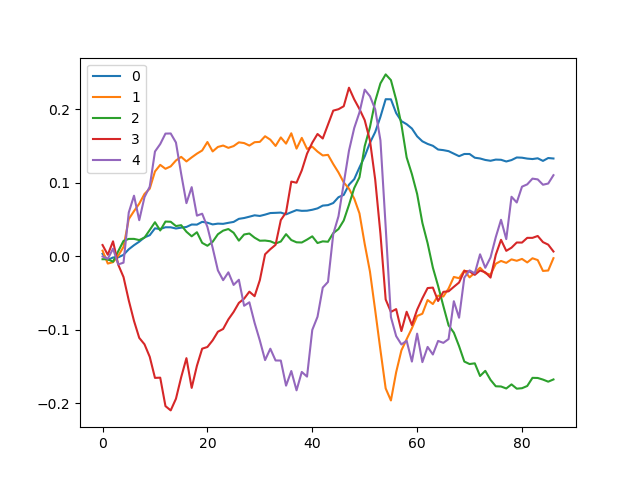

In [422]:
f,ax=plt.subplots(1,1)
ax.plot(evecs[:,:5])
plt.legend(range(5))

What does it tell us if we compare the combinations of first and second dimensions. 4 cases: 
<table> 
    <tr><th>dim 1</th><th>dim 2</th></tr>
    <tr><th>+</th><th>+</th></tr>
    <tr><th>+</th><th>-</th></tr>
    <tr><th>-</th><th>+</th></tr>
    <tr><th>-</th><th>-</th></tr>
</table>


<IPython.core.display.Javascript object>


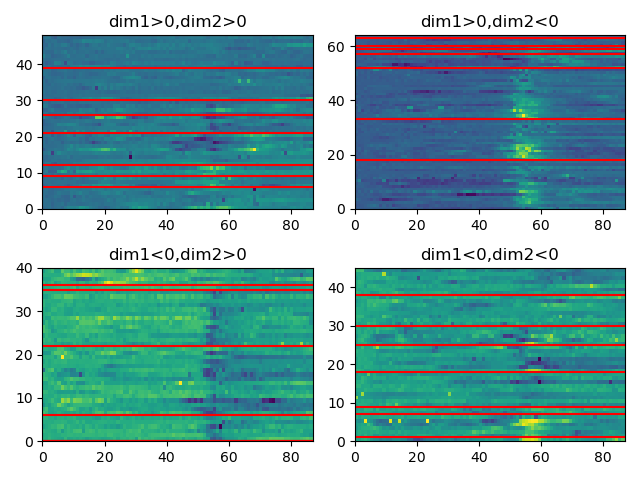

In [12]:
#np.random.seed(1)
#idx=np.random.random_integers(0,len(pureYvals, 4))
categs = np.zeros(len(pureYvals), dtype=int)
for i in range(len(pureYvals)):
    if S[i,0]>0:
        if S[i,1]>0:
            categs[i]=0
        else:
            categs[i]=1
    else:
        if S[i,1]>0:
            categs[i]=2
        else:
            categs[i]=3
f,ax=plt.subplots(2,2)
ax[0,0].set_title('dim1>0,dim2>0')
ax[0,1].set_title('dim1>0,dim2<0')
ax[1,0].set_title('dim1<0,dim2>0')
ax[1,1].set_title('dim1<0,dim2<0')
ax=ax.flatten()
for i in range(4):
    ax[i].pcolormesh(X[categs==i])
    lims=np.histogram(saFly.group_indices[categs==i], bins=np.arange(-0.5,8,1))
    [ax[i].axhline(l, color='r') for l in np.cumsum(lims[0])] #plot lines to group stimulus types
    #ax[i].plot(X[categs==i].T)
    plt.tight_layout()

Judging by this plot, there might actually be some merit in doing it this way. Somewhat surprisingly to me, the cases where the signs oppose another look the most saccade-like. So perhaps we can eloborate on this some more to split saccades

Looking again at dimensions, it becomes obvious that opposing signs of dim 1&2 reinforce each other, because dim1 has a positive peak and dim2 a negative one

#### Parenthesis: What happens if we add the first N dimensions and convolve/inner product WBA signal with that

In [75]:
#newDim = np.sum(evecs())
f,ax=plt.subplots(1,2)
ax[0].plot(evecs[:,:5])
ax[0].set_title('original PCA dimensions')
for i in range(1,5):
    ax[1].plot(np.sum(evecs[:,:i]/(i+1), axis=1))
ax[1].set_title('sum of PCA dimensions')

Already judging by the dimensions that this approach produces, I think it's useless. It rather seems to remove all the advantages of doing PCA. Especially, the peak of the saccades turns to 0 or gets a low emergence from previous behavior. That results in the opposite of what we need.

#### Parenthesis: modify dimensions and set the bump at beginning to 0

<IPython.core.display.Javascript object>


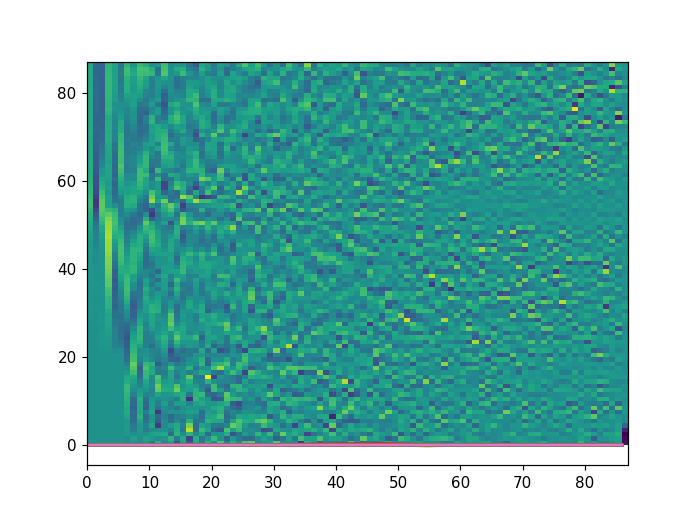

In [17]:
newDims = np.zeros_like(evecs)
for i in range(6):
    new = evecs[:,i]
    module = new[20]
    new[:20] = module
    new -= module
    newDims[:,i] = new
f,ax=plt.subplots(1,1)
ax.plot(newDims)

In [18]:
plt.pcolormesh(evecs)

In [100]:
f,ax=plt.subplots(1,1)
ax.pcolormesh(newDims)

In [19]:
Snew=X@newDims

<IPython.core.display.Javascript object>


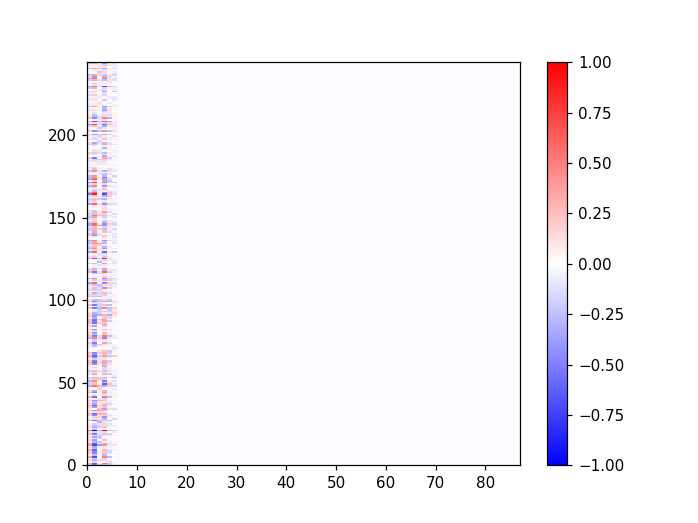

In [20]:
f,ax=plt.subplots(1,1)
ax.pcolormesh(Snew, cmap=plt.get_cmap('bwr'))
plt.colorbar(im)
im.set_clim([-1,1])

More important than doing the transformation with these new dimensions is to do the inverse reconstruction

In [577]:
nDims = 5
SrecNew = S[:,:nDims]@newDims[:,:nDims].T

<IPython.core.display.Javascript object>


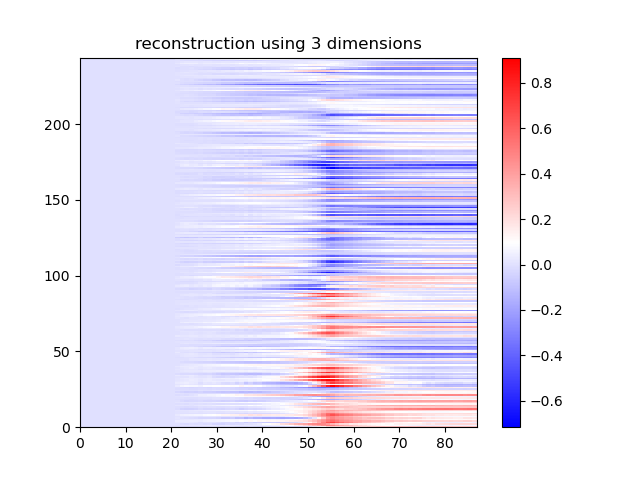

In [510]:
f,ax=plt.subplots(1,1)
im=ax.pcolormesh(SrecNew, cmap=plt.get_cmap('bwr'))
ax.set_title(f'reconstruction using {nDims} dimensions')
plt.colorbar(im)

 ### Specify number of dimensions for reconstruction**

<IPython.core.display.Javascript object>


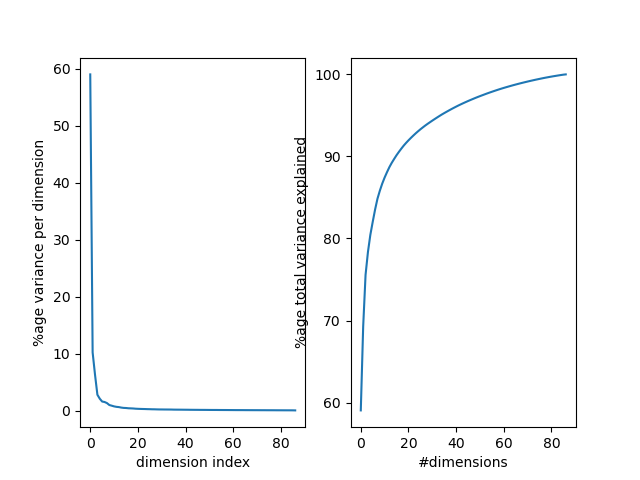

'import plotly.express as px\nf,ax=plt.subplots(1,1)\n#df = px.data.tips()\n#fig = px.violin(df, y="total_bill")\ntemp=np.zeros_like(pureYvals)\nfor i in range(evecs.shape[1]):\n    Srec = S[:,:i] @ evecs[:,:i].T\n    #ax.boxplot(np.sum((pureYvals-Srec)**2,axis=1), positions=[i])\n    #ax.plot(i, np.sum(pureYvals-Srec)**2, \'kx\')\n    temp[:,i]=np.sum((pureYvals-Srec)**2, axis=1)\n#fig=px.violin(temp)\n#fig\nax.boxplot(temp, positions=list(range(evecs.shape[1])))'

In [13]:
# VARIANCE EXPLAINED BY N DIMENSIONS
# single line plots
f,ax=plt.subplots(1,2)
ax[0].plot(evals/sum(evals)*100.)
ax[0].set_xlabel('dimension index')
ax[0].set_ylabel('%age variance per dimension')
ax[1].plot(np.cumsum(evals)/sum(evals)*100.)
ax[1].set_xlabel('#dimensions')
ax[1].set_ylabel('%age total variance explained')

#or box/violin plots
"""import plotly.express as px
f,ax=plt.subplots(1,1)
#df = px.data.tips()
#fig = px.violin(df, y="total_bill")
temp=np.zeros_like(pureYvals)
for i in range(evecs.shape[1]):
    Srec = S[:,:i] @ evecs[:,:i].T
    #ax.boxplot(np.sum((pureYvals-Srec)**2,axis=1), positions=[i])
    #ax.plot(i, np.sum(pureYvals-Srec)**2, 'kx')
    temp[:,i]=np.sum((pureYvals-Srec)**2, axis=1)
#fig=px.violin(temp)
#fig
ax.boxplot(temp, positions=list(range(evecs.shape[1])))"""

In [55]:
# COMPARE ORGINAL AND RECONSTRUCTION SUING N DIMENSIONS
#X=pureYvals
nDims = 3
Srec = S[:,:nDims] @ evecs[:,:nDims].T

<IPython.core.display.Javascript object>


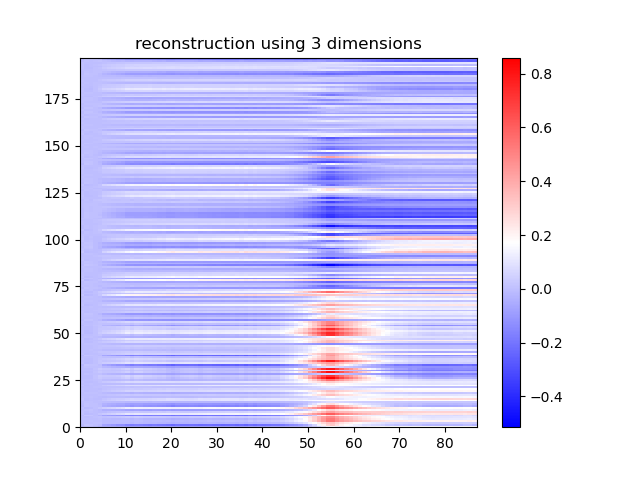

In [56]:
f,ax=plt.subplots(1,1)
im=ax.pcolormesh(Srec, cmap=plt.get_cmap('bwr'))
ax.set_title(f'reconstruction using {nDims} dimensions')
plt.colorbar(im)

In [57]:
saFly.segments.size

197

<IPython.core.display.Javascript object>


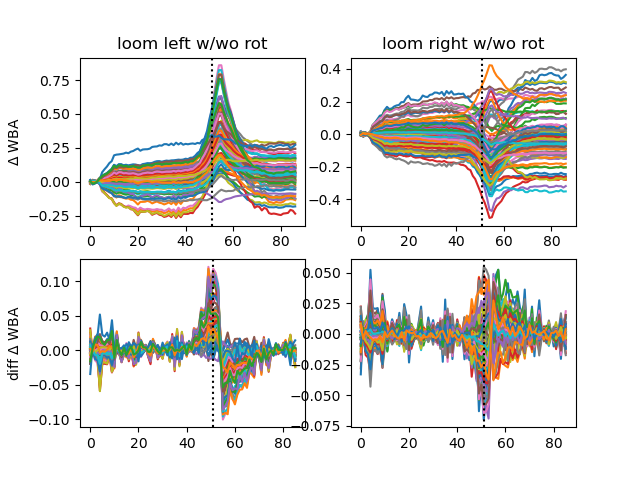

Text(0, 0.5, 'diff $\\Delta$ WBA')

In [58]:
f,ax=plt.subplots(2,2)
for i,s in enumerate(Srec):
    if sumAnlyz.group_indices[i] in range(0,3):
        ax[0,0].plot(s)
        ax[1,0].plot(np.diff(s))
    elif sumAnlyz.group_indices[i] in range(3,6):
        ax[0,1].plot(s)
        ax[1,1].plot(np.diff(s))
[a.axvline(int(sumAnlyz.preStim/sumAnlyz.meanFramePeriod+sumAnlyz.stimulusPhases_inframes[1]),  linestyle=':', color='k') for a in ax.flatten()]
ax[0,0].set_title('loom left w/wo rot')
ax[0,1].set_title('loom right w/wo rot')
ax[0,0].set_ylabel('$\Delta$ WBA')
ax[1,0].set_ylabel('diff $\Delta$ WBA')

### Choose one way to compute a thresholding signal***

#### thresholding differential of PCA reconstruction

<IPython.core.display.Javascript object>


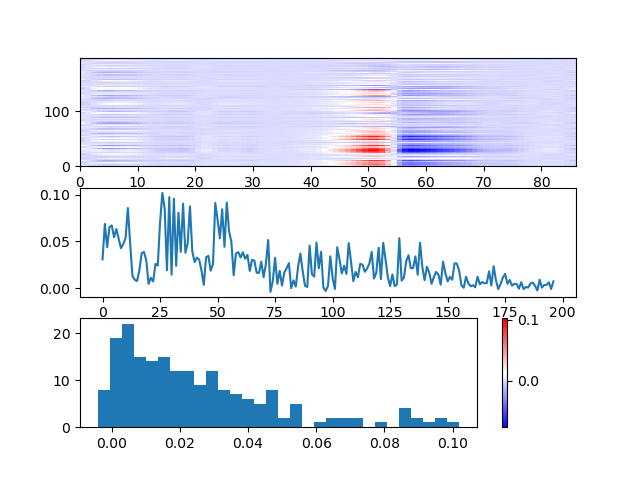

(array([ 8., 19., 22., 15., 14., 15., 12., 12.,  9., 12.,  8.,  7.,  6.,
         5.,  8.,  2.,  5.,  0.,  1.,  2.,  2.,  2.,  0.,  1.,  0.,  4.,
         2.,  1.,  2.,  1.]),
 array([-0.00405074, -0.00052126,  0.00300823,  0.00653771,  0.0100672 ,
         0.01359668,  0.01712617,  0.02065565,  0.02418514,  0.02771462,
         0.03124411,  0.0347736 ,  0.03830308,  0.04183257,  0.04536205,
         0.04889154,  0.05242102,  0.05595051,  0.05947999,  0.06300948,
         0.06653896,  0.07006845,  0.07359794,  0.07712742,  0.08065691,
         0.08418639,  0.08771588,  0.09124536,  0.09477485,  0.09830433,
         0.10183382]),
 <BarContainer object of 30 artists>)

In [18]:
locMax = np.zeros(Srec.shape[0])
sig = ndimage.gaussian_filter1d(np.diff(Srec), 1.5)
endLoom = np.round(sumAnlyz.preStim/sumAnlyz.meanFramePeriod)+sumAnlyz.stimulusPhases_inframes[1]
endLoom=int(endLoom)
for i in range(sig.shape[0]):
    if sumAnlyz.group_indices[i] in range(3,6):
        sig[i] = -sig[i]
    locMax[i] = np.max(sig[i, endLoom-6:endLoom+4])
# PLOT OF THE RESULTING SIGNAL FROM ABOVE
f,ax=plt.subplots(3,1)
im=ax[0].pcolormesh(sig, cmap=plt.get_cmap('bwr'))
plt.colorbar(im)
ax[1].plot(locMax)
ax[2].hist(locMax, bins=30)

In [27]:
dS.shape

(197,)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """


<IPython.core.display.Javascript object>


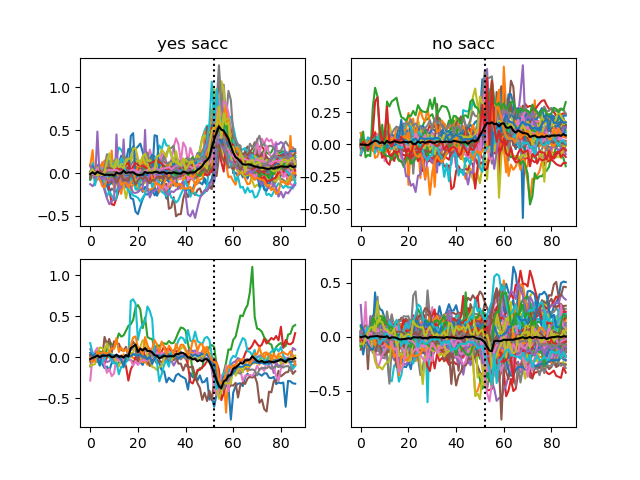

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  app.launch_new_instance()


In [34]:
dS = locMax>0.035
data=X
nTrialsPerStim = [sum(sumAnlyz.group_indices==g) for g in range(8)]

subset = np.zeros_like(dS, dtype=np.bool)
subset[:sum(nTrialsPerStim[:3])] = True
f,ax=plt.subplots(2,2)
ax[0,0].set_title('yes sacc')
ax[0,1].set_title('no sacc')

ax[0,0].plot(data[subset][dS[subset]].T)
ax[0,0].plot(np.mean(data[subset][dS[subset]],axis=0), 'k-')
ax[0,1].plot(data[subset][np.logical_not(dS[subset])].T)
ax[0,1].plot(np.mean(data[subset][np.logical_not(dS[subset])],axis=0), 'k-')

subset = np.zeros_like(dS, dtype=np.bool)
subset[sum(nTrialsPerStim[:3]):sum(nTrialsPerStim[:6])] = True

ax[1,0].plot(data[subset][dS[subset]].T)
ax[1,0].plot(np.mean(data[subset][dS[subset]],axis=0), 'k-')
ax[1,1].plot(data[subset][np.logical_not(dS[subset])].T)
ax[1,1].plot(np.mean(data[subset][np.logical_not(dS[subset])],axis=0), 'k-')

[a.axvline(endLoom, linestyle=':', color='k') for a in ax.flatten()]


In [35]:
doesSaccade = dS

#### zScore of differential after PCA reconstruction

In [59]:
#df = ndimage.gaussian_filter1d(Srec, 1.5)
#df = ndimage.gaussian_filter1d(stats.zscore(np.diff(Srec).T).T, 1.5)
df = stats.zscore(ndimage.gaussian_filter1d(np.diff(Srec), 1.5).T).T

#df = ndimage.gaussian_filter1d(pureYvals, 1.25)
#df = ndimage.gaussian_filter1d(stats.zscore(np.diff(pureYvals).T).T, 1.25)
#df = ndimage.gaussian_filter1d( (pureYvals-np.mean(pureYvals[:,:pureYvals.size//2]))/np.std(pureYvals[:,:pureYvals.size//2]), 1.25)

<IPython.core.display.Javascript object>


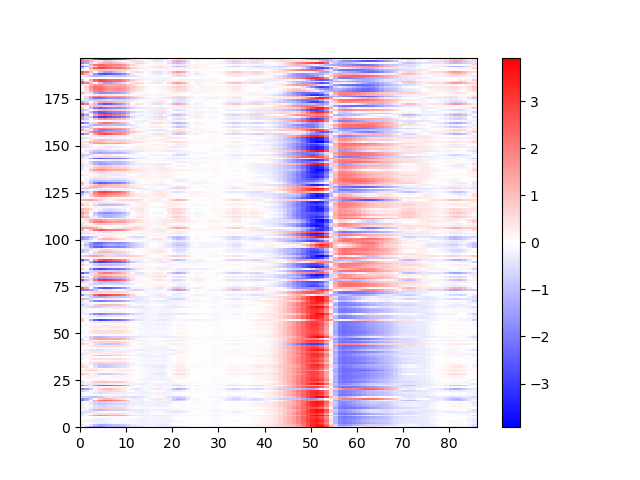

In [60]:
# PLOT OF THE RESULTING SIGNAL FROM ABOVE
f,ax=plt.subplots(1,1)
im=ax.pcolormesh(df, cmap=plt.get_cmap('bwr'))
#im.set_clim([0.75,-0.75])
#im.set_clim([2.5,-2.5])

plt.colorbar(im)
#plt.title('gaussian kernel filtered of zscore of diff of reconstructed')
#plt.title('gaussian kernel filtered of pureYvals using first half of trial as reference')

In [61]:
nTrialsPerStim = [sum(sumAnlyz.group_indices==g) for g in range(8)]
nTrialsPerStim

[25, 24, 24, 29, 30, 23, 21, 21]

In [65]:
# SELECT TRIALS WHERE ZSCORE IS HIGH ENOUGH AROUND MAXIMUM LOOMING
#frame Nr where looming is maximal 
endLoom = np.round(sumAnlyz.preStim/sumAnlyz.meanFramePeriod)+sumAnlyz.stimulusPhases_inframes[1]
endLoom=int(endLoom)
#sumAnlyz.stimulusPhases_inframes[-1]+sumAnlyz.preStim/sumAnlyz.meanFramePeriod

#detect based on z-threshold
zThresh=2.1
saccadeLeft = np.sum(df[:,endLoom-2:endLoom+1] > zThresh, axis=1)>2
saccadeRight = np.sum(df[:,endLoom-2:endLoom+1] < -zThresh, axis=1)>2
#saccadeLeft = np.max(df[:,endLoom-2:endLoom+2] > zThresh, axis=1)
#saccadeRight = np.min(df[:,endLoom-2:endLoom+2] < -zThresh, axis=1)
print('N saccades left:',sum(saccadeLeft))
print('N saccades right:',sum(saccadeRight))
print('number of looming left stims:',sum(nTrialsPerStim[:3]))
print('number of looming right stims:',sum(nTrialsPerStim[3:6]))

N saccades left: 80
N saccades right: 53
number of looming left stims: 73
number of looming right stims: 82


**Check if the threshold makes sense for your data**

<IPython.core.display.Javascript object>


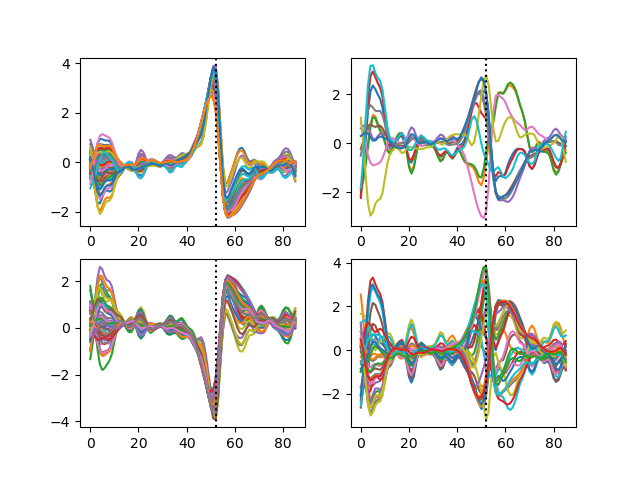

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # This is added back by InteractiveShellApp.init_path()
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


In [66]:
# FIRST LOOKING AT SIGNAL USED FOR THRESHOLDING
f,ax=plt.subplots(2,2)
ax=ax.flatten()

#data = pureYvals
#data = Srec
data=df

nTrialsPerStim = [sum(sumAnlyz.group_indices==g) for g in range(8)]

subset = np.zeros_like(saccadeLeft, dtype=np.bool)
subset[:sum(nTrialsPerStim[:3])] = True

ax[0].plot(data[subset][saccadeLeft[subset]].T)
ax[0].axvline(endLoom, color='k', linestyle=':')

ax[1].plot(data[subset][np.logical_not(saccadeLeft[subset])].T)
ax[1].axvline(endLoom, color='k', linestyle=':')

subset = np.zeros_like(saccadeLeft, dtype=np.bool)
subset[sum(nTrialsPerStim[:3]):sum(nTrialsPerStim[:6])] = True

ax[2].plot(data[subset][saccadeRight[subset]].T)
ax[2].axvline(endLoom, color='k', linestyle=':')

ax[3].plot(data[subset][np.logical_not(saccadeRight[subset])].T)
ax[3].axvline(endLoom, color='k', linestyle=':')


<IPython.core.display.Javascript object>


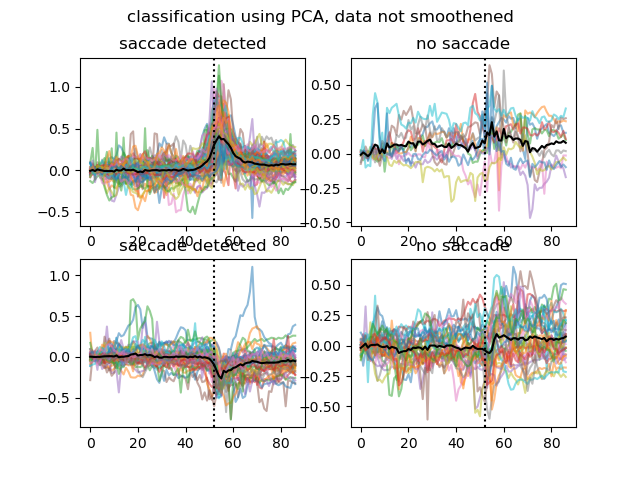

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  # This is added back by InteractiveShellApp.init_path()
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


Text(0.5, 0.98, 'classification using PCA, data not smoothened')

In [67]:
# THEN FOR THE ORIGINAL FILTERED SIGNAL
f,ax=plt.subplots(2,2)
ax=ax.flatten()

#data = pureYvals
data=X
#data = Srec

nTrialsPerStim = [sum(sumAnlyz.group_indices==g) for g in range(8)]

subset = np.zeros_like(saccadeLeft, dtype=np.bool)
subset[:sum(nTrialsPerStim[:3])] = True

ax[0].plot(data[subset][saccadeLeft[subset]].T, alpha=0.5)
ax[0].plot(np.mean(data[subset][saccadeLeft[subset]],axis=0), 'k-') 
ax[0].axvline(endLoom, color='k', linestyle=':')

ax[1].plot(data[subset][np.logical_not(saccadeLeft[subset])].T, alpha=0.5)
ax[1].plot(np.mean(data[subset][np.logical_not(saccadeLeft[subset])],axis=0), 'k-') 
ax[1].axvline(endLoom, color='k', linestyle=':')

subset = np.zeros_like(saccadeLeft, dtype=np.bool)
subset[sum(nTrialsPerStim[:3]):sum(nTrialsPerStim[:6])] = True

ax[2].plot(data[subset][saccadeRight[subset]].T, alpha=0.5)
ax[2].plot(np.mean(data[subset][saccadeRight[subset]],axis=0), 'k-') 
ax[2].axvline(endLoom, color='k', linestyle=':')

ax[3].plot(data[subset][np.logical_not(saccadeRight[subset])].T, alpha=0.5)
ax[3].plot(np.mean(data[subset][np.logical_not(saccadeRight[subset])],axis=0), 'k-') 
ax[3].axvline(endLoom, color='k', linestyle=':')

ax[0].set_title('saccade detected')
ax[1].set_title('no saccade')
ax[2].set_title('saccade detected')
ax[3].set_title('no saccade')
plt.suptitle('classification using PCA, data not smoothened')

#### compare detected saccades depending on N reconstruction dimensions**

Don't have a nice o do it rightnow, and turning everything into a function is not a great idea because it will be huge, too complex, and all the intermediate comments and checks will be lost

Instead, store results in dict and rerun with anoter nDim above

In [68]:
detectionComparison = {}

In [69]:
detectionComparison[nDims] = {'left':saccadeLeft, 'right':saccadeRight}
list(detectionComparison.keys())

[3]

<IPython.core.display.Javascript object>


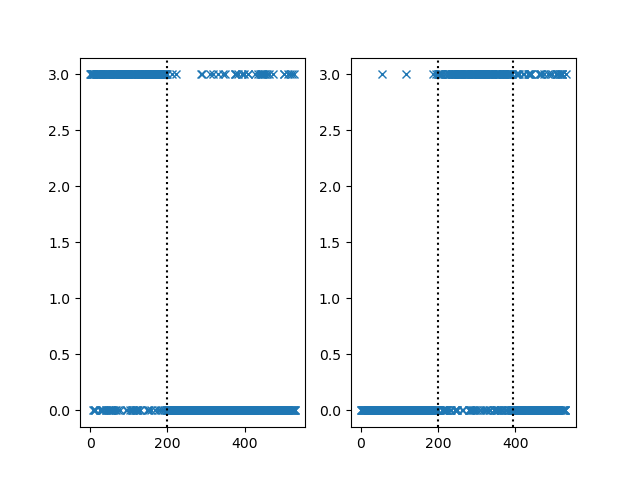

In [705]:
f,ax=plt.subplots(1,2)
for k,it in detectionComparison.items():
    ax[0].plot(it['left']*k, 'x')
    ax[1].plot(it['right']*k, 'x')
ax[0].axvline(sum(nTrialsPerStim[:3]),color='k', linestyle=':')
ax[1].axvline(sum(nTrialsPerStim[:3]),color='k', linestyle=':')
ax[1].axvline(sum(nTrialsPerStim[:6]),color='k', linestyle=':')

<IPython.core.display.Javascript object>


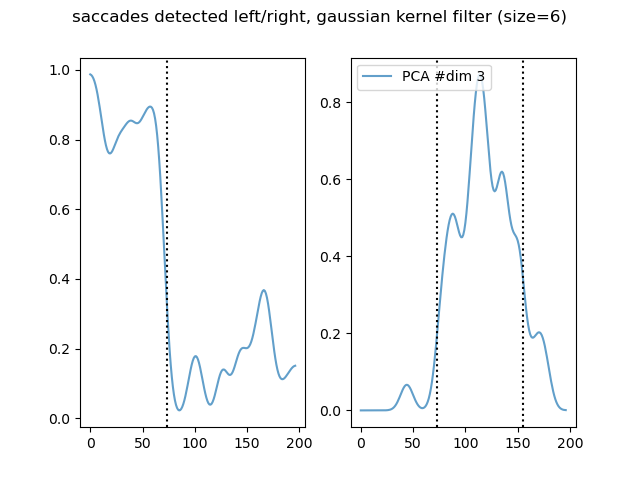

In [70]:
f,ax=plt.subplots(1,2)
for k,it in detectionComparison.items():
    ax[0].plot(ndimage.gaussian_filter1d(it['left'].astype('float'), 6.), alpha=0.7)
    ax[1].plot(ndimage.gaussian_filter1d(it['right'].astype('float'),6.), alpha=0.7)
ax[0].axvline(sum(nTrialsPerStim[:3]),color='k', linestyle=':')
ax[1].axvline(sum(nTrialsPerStim[:3]),color='k', linestyle=':')
ax[1].axvline(sum(nTrialsPerStim[:6]),color='k', linestyle=':')
plt.suptitle('saccades detected left/right, gaussian kernel filter (size=6)')
plt.legend(['PCA #dim '+str(k) for k in detectionComparison.keys()])

<IPython.core.display.Javascript object>


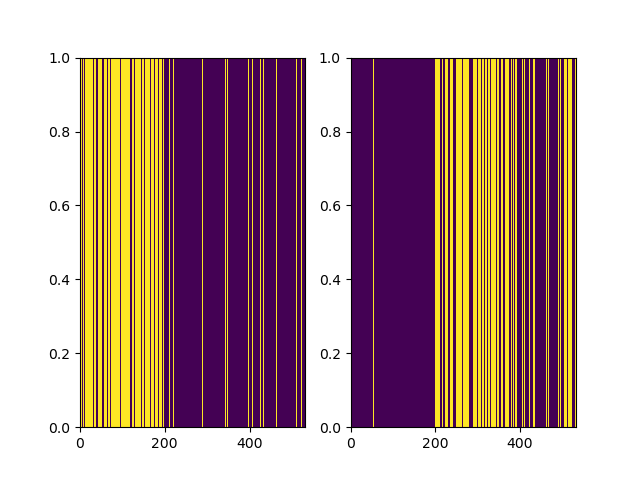

In [707]:
f,ax=plt.subplots(1,2)
temp=map(lambda d: d[1]['left'], detectionComparison.items())
ax[0].pcolormesh(np.array(list(temp)))
temp=map(lambda d: d[1]['right'], detectionComparison.items())
ax[1].pcolormesh(np.array(list(temp)))

<IPython.core.display.Javascript object>


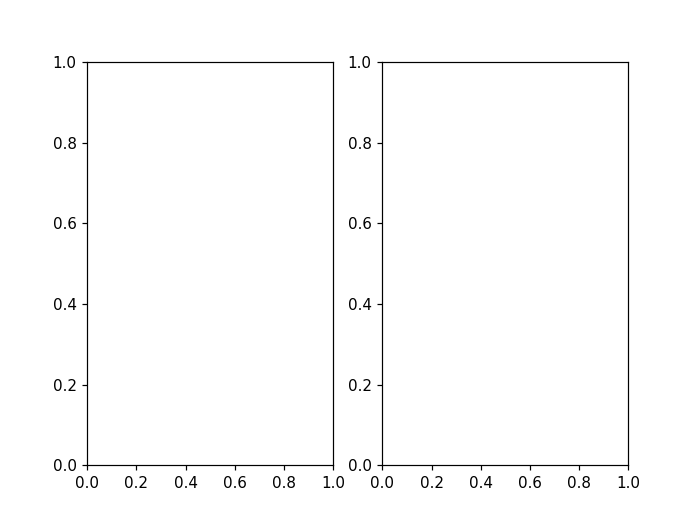

KeyError: 4

In [75]:
f,ax=plt.subplots(1,2)
compare=[4,3]
ax[0].plot(detectionComparison[compare[0]]['left'].astype('int')-detectionComparison[compare[1]]['left'].astype('int'), 'kx')
ax[1].plot(detectionComparison[compare[0]]['right'].astype('int')-detectionComparison[compare[1]]['right'].astype('int'), 'kx')

### save where saccades are happening in variable name expected downstream**

In [71]:
#additional check if any trials have been deteced as both left & right saccades
all( (detectionComparison[nDims]['left'] != detectionComparison[nDims]['right']) == np.logical_or(detectionComparison[nDims]['left'], detectionComparison[nDims]['right']) )

True

In [72]:
nDims=3
doesSaccade = detectionComparison[nDims]['left'] != detectionComparison[nDims]['right'] #!= for booleans gives xor

In [73]:
# check if sorted
assert(not any(np.diff(saFly.group_indices)<0))
#draw saccades only from relevant section
doesSaccade = np.concatenate((detectionComparison[nDims]['left'][:sum(nTrialsPerStim[:3])],
                              detectionComparison[nDims]['right'][sum(nTrialsPerStim[:3]):sum(nTrialsPerStim[:6])],
                              np.zeros(sum(nTrialsPerStim[6:8]), dtype=np.bool)
                             ))

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


In [74]:
assert(doesSaccade.size==saFly.segments.size)

### split saccading <-> non-saccading
Similar to splitting flying and resting

In [75]:
'''split the present Analyzer class into two new classes, one containing the trials where animal is doing a saccade, the others where not
Assumes that the sorting saccade/unreactive has already happened, using e.g. remove_dud_gui()'''
import copy
helperLibrary.resampleAnalyzer(saFly)
saSaccade = copy.copy(saFly)
saStraight = copy.copy(saFly)
saStraight.remove_duds_byList( np.where(doesSaccade)[0])
saSaccade.remove_duds_byList( np.where(np.logical_not(doesSaccade))[0])


In [76]:
saSaccade.average_flywise()
saStraight.average_flywise()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


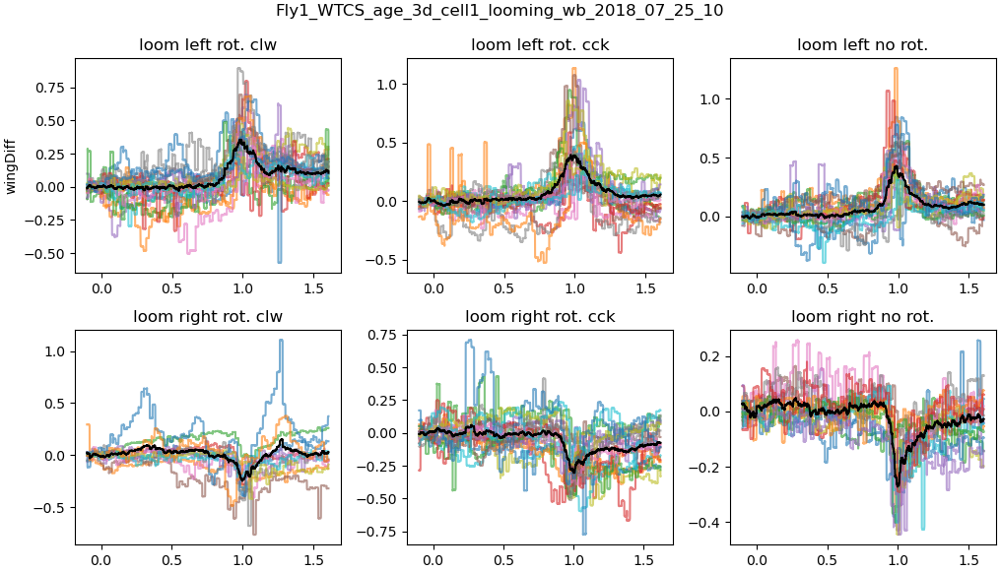

In [77]:
saSaccade.plot_by_stimSignal('wingDiff')

<IPython.core.display.Javascript object>


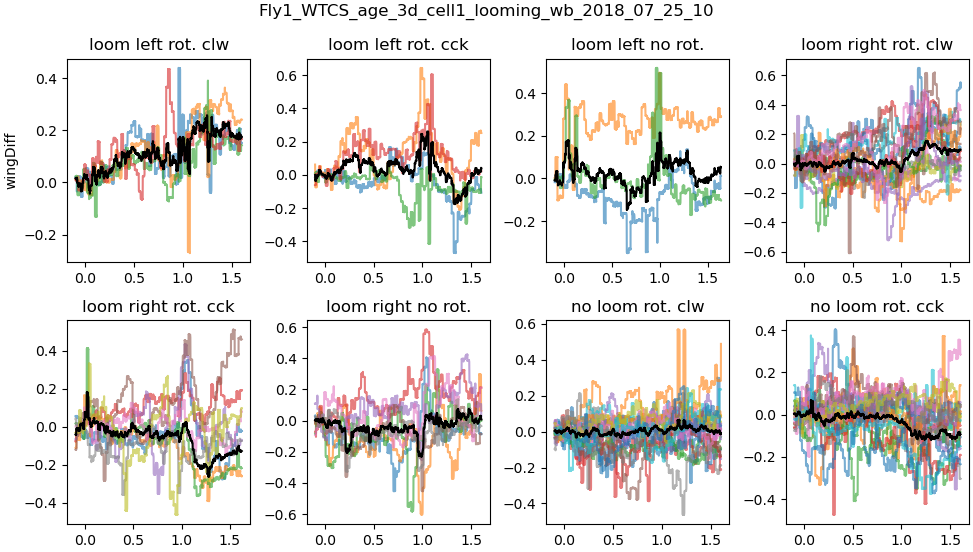

<IPython.core.display.Javascript object>

In [78]:
saStraight.plot_by_stimSignal('wingDiff')

In [79]:
print(saFly.segments.size, saFly.group_indices.size)
print(saSaccade.segments.size, saSaccade.group_indices.size)
print(saStraight.segments.size, saStraight.group_indices.size)

197 197
110 110
87 87


In [80]:
saSaccade.segments.size+saStraight.segments.size==saFly.segments.size

True

<IPython.core.display.Javascript object>


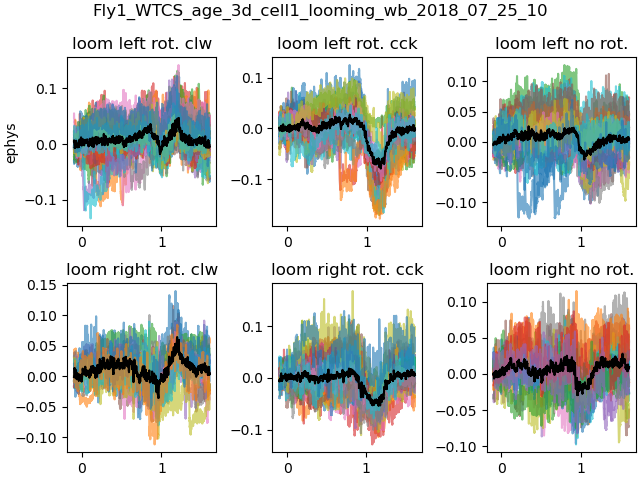

<IPython.core.display.Javascript object>


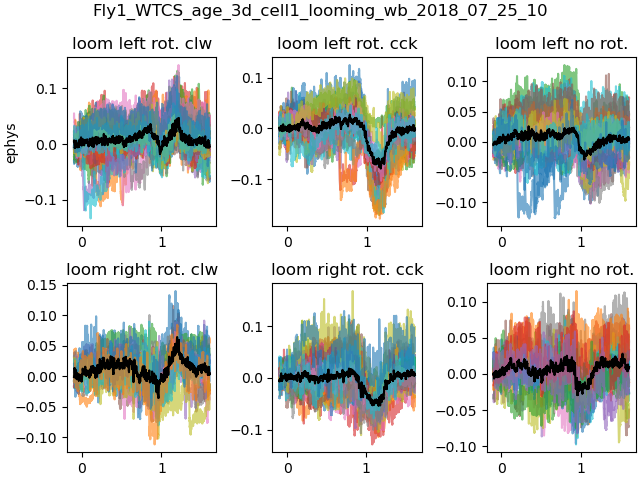

In [84]:
saSaccade.average_flywise()
saSaccade.plot_by_stimSignal('ephys')

<IPython.core.display.Javascript object>


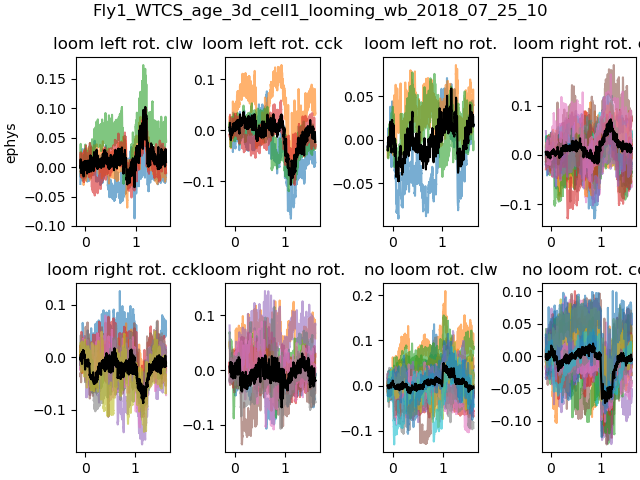

<IPython.core.display.Javascript object>


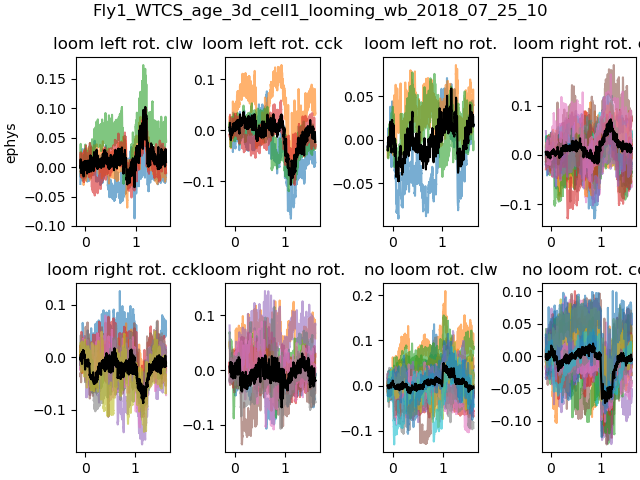

In [85]:
saStraight.average_flywise()
saStraight.plot_by_stimSignal('ephys')

## DWT/subband coding
##### new try at saccade detection with DWT/subband coding

In [15]:
import pywt

def subBandFilter(data, clipLevel=4):
    #wave='coif3'
    wave='db4'
    if data.ndim==1:
        data=data.reshape(1,data.size)
    for idx in range(data.shape[0]):
        y=data[idx]
        coeffs=pywt.wavedec(y, wave)
        coeffs[clipLevel:]=[np.zeros_like(arr) for arr in coeffs[clipLevel:]]
        rec=pywt.waverec(coeffs, wave)
    return rec

In [ ]:
data = saFly.get_by_group(2, 'wingDiff').copy()
f,ax=plt.subplots(2,1)
ax2=ax[1]
ax=ax[0]
for i in range(len(data)):
    filt = subBandFilter(data[i], 3)
    ax.plot(data[i])
    ax.plot(filt)
    ax.plot([0,15000],[np.median(filt[5000:6000])+0.2]*2 , 'k:')
    ax2.plot(filt[5:]-filt[:-5])
    plt.waitforbuttonpress()
    ax.clear()

In [14]:
data = saFly.get_by_group(2, 'wingDiff').copy()
f,ax=plt.subplots(2,1)
ax2=ax[1]
ax=ax[0]
i=0
filt = subBandFilter(data[i], 3)
ax.plot(data[i])
ax.plot(filt)
ffilt= np.vstack((np.insert(filt[:-3],0,[np.nan]*3), np.insert(filt[:-2],0,[np.nan]*2), np.insert(filt[:-1],0,[np.nan]), filt, np.append(filt[1:],[np.nan]), np.append(filt[2:],[np.nan]*2),np.append(filt[3:],[np.nan]*3) ))
print(ffilt.shape)
ffilt=np.nanmean(ffilt, axis=0)
#ffilt=signal.filtfilt(np.ones(5),np.ones(5), filt)
ax.plot(ffilt)
ax.plot([0,15000],[np.median(filt[5000:6000])+0.2]*2 , 'k:')
ax2.plot(np.diff(filt))
ax2.plot(np.diff(ffilt))
#ax2.plot(filt[1:]-filt[:-1])
#ax2.plot(filt[5:]-filt[:-5])

(7, 17052)


In [97]:
f,ax=plt.subplots(4,4)
ax=ax.flatten()
for i in range(data.shape[0]):
    #ax[i].plot(data[i])
    coeffs=pywt.wavedec(data[i], 'db4')
    ax[i].plot(stats.zscore(coeffs[2]) )
    ax[i].set_title("%.2f  %.2f"%( coeffs[2][14]-coeffs[2][13], coeffs[2][15]-coeffs[2][14] ))
    print(i,coeffs[2][14]-coeffs[2][13], coeffs[2][15]-coeffs[2][14] )
    #print(i,sum([abs(coeffs[2][14]-coeffs[2][13]), coeffs[2][15]-coeffs[2][14] ]))
    print(i,coeffs[2][15]-coeffs[2][14]-(coeffs[2][14]-coeffs[2][13]) )

NameError: name 'data' is not defined

In [37]:
y=data[5]
f,ax=plt.subplots(1,1)
ax.plot(y)
plt.plot(subBandFilter(y,4))
plt.plot(subBandFilter(y,3))

coeffs=pywt.wavedec(y,'db4')
coeffs[3:]=[np.zeros_like(arr) for arr in coeffs[3:]]
#coeffs[1]=np.zeros_like(coeffs[1])
coeffs[1]=pywt.threshold(coeffs[1], 3.5,'soft',1)
#coeffs[1]=pywt.threshold(coeffs[0], 3,'soft',1)
#coeffs[0]=pywt.threshold(coeffs[0], 6,'hard')
#coeffs[1]/=2
#coeffs[2]/=2
#coeffs[0]/=2
filt=pywt.waverec(coeffs, 'db4')
plt.plot(filt)

In [59]:
saFly.plot_by_stimSignal('wingR')

In [57]:
#decomposition coefficitents of filtered signal is again the same, apart for a few marginal boundary effects
y=data[5]
f,ax=plt.subplots(4,3)
ax=ax.flatten()
coeffs=pywt.wavedec(y,'db4')
for i in range(len(coeffs)):
    ax[i].plot(coeffs[i])
coeffs[3:]=[np.zeros_like(arr) for arr in coeffs[3:]]
coeffs[0]=np.zeros_like(coeffs[0])
for i in range(len(coeffs)):
    ax[i].plot(coeffs[i])
filt=pywt.waverec(coeffs, 'db4')
coeffs=pywt.wavedec(filt, 'db4')
for i in range(len(coeffs)):
    ax[i].plot(coeffs[i])

# Example plots
These plots are not what has been included in the paper but represent earlier stages of analysis to get an idea of what is going on, before making sense of the variability. They help to systematically compare outcomes of various saccade detection algorithms.

## I have to resample after all

In [86]:
helperLibrary.resampleAnalyzer(saStraight)

In [87]:
helperLibrary.resampleAnalyzer(saSaccade)

In [88]:
helperLibrary.resampleAnalyzer(saFly)

In [438]:
# this should take 0 time, because saFly schould include the exact same segments
helperLibrary.resampleAnalyzer(sumAnlyz)#
helperLibrary.resampleAnalyzer(anlyz)#

## examples of how to plot

In [87]:
saFly.timeax -= saFly.meanFramePeriod*saFly.stimulusPhases_inframes[1]

<IPython.core.display.Javascript object>


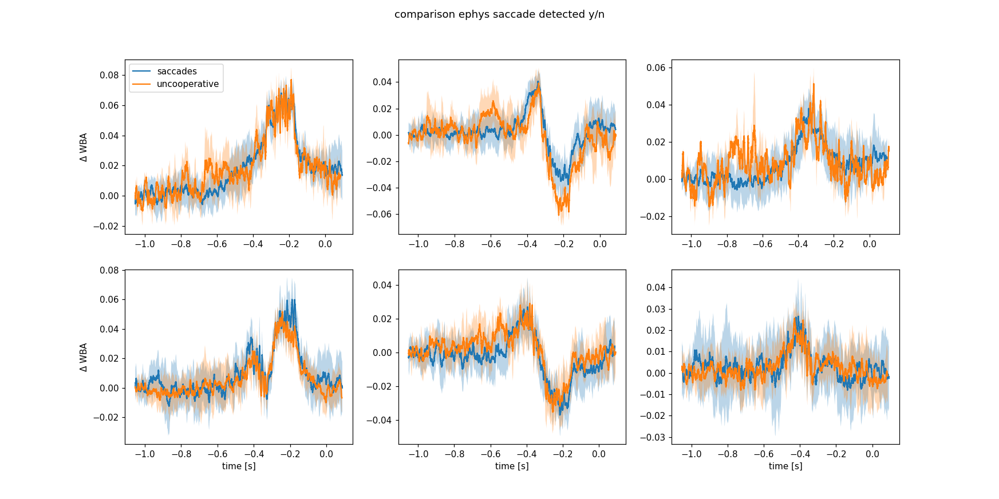

Text(0.5, 0.98, 'comparison ephys saccade detected y/n')

In [89]:
# COMPARISON OF WING DIFFS FOR SACCADE YES OR NO -> AVERAGING SIMPLY OVER GROUP_ID
#datatype = 'wingDiff'
datatype = 'ephys'

saSaccade.average_by_stimSignal()
saStraight.average_by_stimSignal()

f,ax=plt.subplots(2,3, figsize=(16.,8.))
ax=ax.flatten()
allSaccMean = saSaccade.get_avg_data(datatype)
allStrgMean = saStraight.get_avg_data(datatype)
allSaccStd = saSaccade.get_std_data(datatype)
allStrgStd = saStraight.get_std_data(datatype)
for i in range(6):
    saccMean = allSaccMean[i]
    restMean = allStrgMean[i]
    saccStd = allSaccStd[i]
    restStd = allStrgStd[i]
    ax[i].plot(saSaccade.timeax[:saccMean.size], saccMean)
    ax[i].fill_between(saFly.timeax[:saccMean.size], saccMean+saccStd, saccMean-saccStd, alpha=0.3)
    ax[i].plot(saSaccade.timeax[:restMean.size], restMean)
    ax[i].fill_between(saFly.timeax[:restMean.size], restMean+restStd, (restMean-restStd), alpha=0.3)
ax[0].set_ylabel('$\Delta $ WBA')
ax[3].set_ylabel('$\Delta $ WBA')
[ax[i].set_xlabel('time [s]') for i in range(3,6) ]
ax[0].legend(['saccades','uncooperative'], loc='upper left')
plt.suptitle(f'comparison {datatype} saccade detected y/n')

#f.savefig(os.path.join('C:/Users/fischer/Desktop/figures_November2020/',certainFly,'comparison_'+datatype+'_ifSaccade.png'))

In [64]:
# COMPARISON OF WING DIFFS FOR SACCADE YES OR NO -> AVERAGING PER FLY
saSaccade.average_flywise()
saStraight.average_flywise()

datatype = 'wingDiff'
#datatype = 'ephys'
f,ax=plt.subplots(2,3)
ax=ax.flatten()
saccMean = saSaccade.get_avg_data(datatype)
restMean = saStraight.get_avg_data(datatype)
saccStd = saSaccade.get_std_data(datatype)
restStd = saStraight.get_std_data(datatype)
for i in range(6):
    ax[i].plot(saSaccade.timeax[:saccMean[i].size], saccMean[i])
    ax[i].fill_between(saFly.timeax[:saccMean[i].size], saccMean[i]+saccStd[i], saccMean[i]-saccStd[i], alpha=0.3)
    ax[i].plot(saSaccade.timeax[:restMean[i].size], restMean[i])
    ax[i].fill_between(saFly.timeax[:restMean[i].size], restMean[i]+restStd[i], (restMean[i]-restStd[i]), alpha=0.3)
#ax[0].set_ylabel('$\Delta $ WBA')
#ax[3].set_ylabel('$\Delta $ WBA')
ax[0].set_ylabel(datatype)
ax[3].set_ylabel(datatype)
[ax[i].set_xlabel('time [s]') for i in range(3,6) ]
ax[0].legend(['saccades','uncooperative'], loc='upper left')
plt.suptitle(f'comparison {datatype} saccade detected y/n')

Text(0.5, 0.98, 'comparison wingDiff saccade detected y/n')

In [7]:
saSaccade.print_N_stims_per_fly()

		loom left rot. clw	loom left rot. cck	loom left no rot.	loom right rot. clw	loom right rot. cck	loom right no rot.	no loom rot. clw	no loom rot. cck
fly4_X21_20200420_cell1		7		6		7		2		3		6		2		1
fly3_x21_20200417_cell1		4		5		3		7		8		3		2		3
fly3_X21_20200415_cell1		4		7		9		4		6		6		4		5
fly6_X20a_20200319_cell1		1		4		2		2		4		1		0		0
fly1_X20a_20200316_cell1		5		9		6		4		11		2		2		4
fly1_U29xG16_20200129_cell1		7		13		10		12		13		13		6		4
fly3_U29xG16_20200129_cell1		6		7		3		4		4		2		2		0
fly2_U29xG16_20200110_cell1		6		5		5		2		0		3		0		0
fly2_G16xU29_20191223_cell1		5		2		6		1		2		4		0		1
fly1_WTCS_20191106_cell1		5		6		10		9		7		13		4		4
fly1_G06xU29_20191104_cell1		2		4		6		4		5		3		2		3
fly1_WTCS_20190213_cell1		0		0		2		3		2		2		3		0


In [8]:
saStraight.print_N_stims_per_fly()

		loom left rot. clw	loom left rot. cck	loom left no rot.	loom right rot. clw	loom right rot. cck	loom right no rot.	no loom rot. clw	no loom rot. cck
fly4_X21_20200420_cell1		0		2		0		3		8		2		5		7
fly3_x21_20200417_cell1		5		3		1		2		0		0		2		5
fly3_X21_20200415_cell1		3		2		0		6		7		7		5		5
fly6_X20a_20200319_cell1		2		2		2		0		1		0		4		3
fly1_X20a_20200316_cell1		6		5		5		9		3		6		10		10
fly1_U29xG16_20200129_cell1		10		5		5		5		6		6		11		14
fly3_U29xG16_20200129_cell1		1		1		1		2		7		5		8		5
fly2_U29xG16_20200110_cell1		0		1		2		1		4		5		3		2
fly2_G16xU29_20191223_cell1		2		4		1		4		3		2		4		4
fly1_WTCS_20191106_cell1		9		12		5		7		11		4		10		13
fly1_G06xU29_20191104_cell1		6		5		7		5		4		7		7		8
fly1_WTCS_20190213_cell1		1		2		1		3		1		0		1		2


This is a superposition plot, where we compare the combined stimulus (loom+rotation) to the linear addition of each indivudally.

In [69]:
import copy
saSaccBAK = copy.copy(saSaccade)
saStgBAK = copy.copy(saStraight)
saFlyBAK = copy.copy(saFly)

In [68]:
saSaccade = copy.copy(saSaccBAK)
saStraight = copy.copy(saStgBAK)
saFly = copy.copy(saFlyBAK)

NameError: name 'saSaccBAK' is not defined

In [79]:
certainFly = 'fly1_U29xG16_20191209_cell2'
def retrieveCertainFly(certainFly):
    """retrieve data belonging to a certain fly only from the entire collection"""
    print(certainFly)
    flyIdx = [k for k,v in saSaccade.flyID.items() if v==certainFly]
    assert(len(flyIdx)==1)
    flyIdx = flyIdx[0]
    flySelect = saSaccade.fly_indices==flyIdx
    saSaccade.remove_duds_byList(np.where(np.logical_not(flySelect))[0])

    flyIdx = [k for k,v in saStraight.flyID.items() if v==certainFly]
    assert(len(flyIdx)==1)
    flyIdx = flyIdx[0]
    flySelect = saStraight.fly_indices==flyIdx
    saStraight.remove_duds_byList(np.where(np.logical_not(flySelect))[0])

    flyIdx = [k for k,v in saFly.flyID.items() if v==certainFly]
    assert(len(flyIdx)==1)
    flyIdx = flyIdx[0]
    flySelect = saFly.fly_indices==flyIdx
    saFly.remove_duds_byList(np.where(np.logical_not(flySelect))[0])
    
    return saFly, saSaccade, saStraight

### diff saccade VS not

In [221]:
def compare_flight_rest(gid, saFly, saRest):
    flyMean = saFly.meanSegments[gid][0,:]
    #plt.plot(saFly.timeax[:flyMean.size], flyMean*100., alpha=0.7)
    restMean = saRest.meanSegments[gid][0,:]
    #plt.plot(saRest.timeax[:restMean.size], restMean*100., alpha=0.7)
    maxLen = max([flyMean.size, restMean.size])
    diffMean = np.pad( flyMean,(0,maxLen-flyMean.size),'constant',constant_values=np.nan ) - np.pad( restMean,(0,maxLen-restMean.size), 'constant',constant_values=np.nan )
    #plt.plot(saFly.timeax[:diffMean.size], diffMean*100.)
    return diffMean

saSaccade.average_flywise()
saStraight.average_flywise()

colors=['#3bb143', '#0b6623', '#708238', '#4682b4', '#0f52ba', '#6593f5']
#ori=47*saFly.meanFramePeriod
ori=0
f,ax=plt.subplots(1,1, figsize=(9.,6.))
#ax=ax.flatten()
for i in range(0,6):
    try:
        tmp=compare_flight_rest(i, saSaccade, saStraight)
        ax.plot(saFly.timeax[:tmp.size], tmp, color=colors[i])
    except KeyError:
        pass
plt.xlabel('time [s]')
plt.ylabel('U [mV]')
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
#plt.xlim([-ori,74*saFly.meanFramePeriod-ori])
#plt.ylim([-4.95, 4.9])
plt.legend([saFly.get_stimulusmap(i) for i in range(0,6)])

#f.savefig(os.path.join('C:/Users/fischer/Desktop/figures_November2020/',certainFly,'saccadesVSuncooperativeOnly_diffs__allStims.png'))

In [332]:
# As a batch job for each fly individually

flyid = [v for k,v in saFly.flyID.items()]
for fid in flyid:
    saSaccade = copy.copy(saSaccBAK)
    saStraight = copy.copy(saStgBAK)
    saFly = copy.copy(saFlyBAK)
    certainFly = fid
    
    flyIdx = [k for k,v in saSaccade.flyID.items() if v==certainFly]
    assert(len(flyIdx)==1)
    flyIdx = flyIdx[0]
    flySelect = saSaccade.fly_indices==flyIdx
    saSaccade.remove_duds_byList(np.where(np.logical_not(flySelect))[0])

    flyIdx = [k for k,v in saStraight.flyID.items() if v==certainFly]
    assert(len(flyIdx)==1)
    flyIdx = flyIdx[0]
    flySelect = saStraight.fly_indices==flyIdx
    saStraight.remove_duds_byList(np.where(np.logical_not(flySelect))[0])
    
    saSaccade.average_flywise()
    saStraight.average_flywise()

    colors=['#3bb143', '#0b6623', '#708238', '#4682b4', '#0f52ba', '#6593f5']
    #ori=47*saFly.meanFramePeriod
    ori=0
    f,ax=plt.subplots(1,1, figsize=(9.,6.))
    #ax=ax.flatten()
    for i in range(0,6):
        try:
            tmp=compare_flight_rest(i, saSaccade, saStraight)
            #tmp=compare_flight_rest(i, saFly, saRest)
            ax.plot(saFly.timeax[:tmp.size], tmp, color=colors[i])
        except KeyError:
            pass
    ax.set_xlabel('time [s]')
    ax.set_ylabel('U [mV]')
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    #plt.xlim([-ori,74*saFly.meanFramePeriod-ori])
    #plt.ylim([-4.95, 4.9])
    ax.legend([saFly.get_stimulusmap(i) for i in range(0,6)])
    ax.set_title(fid)
    f.savefig(os.path.join('F:/Caesar/RecorderData/saccVSstraight_allStims/',certainFly+f'_saccadesVSuncoop_diffs__allStims_PCAdims{nDims}.png'))

In [189]:
saSaccade.plotMean('wingDiff')
#saStraight.plotMean('ephys')

IndexError: list index out of range

### batch plotting of combo vs prediction

#### all flies individually

In [96]:
def linPredictPlot(anlyz, saFly):
    datatype = 'ephys'

    #operating on flywise averages
    saccMean = anlyz.get_avg_data(datatype)
    temp = saFly.get_avg_data(datatype)
    saccMean[6] = temp[6]
    saccMean[7] = temp[7]
    
    #offset = lambda a: a-np.mean(a[a.size//2:a.size//2+300])
    offset = lambda a: signal.medfilt(a,101)
    
    #saccStd = anlyz.get_std_data(datatype)
    """saccMean = {i:getMean(saSaccade, i, datatype) for i in range(6)}
    temp = saFly.get_avg_data(datatype)
    saccMean[6] = temp[6]
    saccMean[7] = temp[7]"""

    titles=['loom left rot CLW', 'loom left rot CCK', 'loom right rot CLW', 'loom right rot CCK']
    f,ax=plt.subplots(2,2, figsize=(16.,8.))
    ax=ax.flatten()
    for i in range(4):
        combi = i%2+(i//2)*3
        candidates = [(i//2)*3+2, i%2+6]
        try:
            minLen = min(saccMean[candidates[0]].size, saccMean[candidates[1]].size)
            linPredict = offset(saccMean[candidates[0]][:minLen]) + offset(saccMean[candidates[1]][:minLen])

            ax[i].plot(anlyz.timeax[:saccMean[combi].size], offset(saccMean[combi])*100.)
            #ax[i].plot(anlyz.timeax[:saccMean[candidates[0]].size], offset(saccMean[candidates[0]]))
            #ax[i].plot(anlyz.timeax[:saccMean[candidates[1]].size], offset(saccMean[candidates[1]]))
            ax[i].plot(anlyz.timeax[:linPredict.size], linPredict*100., color='r')
        except KeyError:
            pass
        ax[i].set_title(titles[i])
    return f
    #f.savefig(os.path.join('C:/Users/fischer/Desktop/figures_November2020/',certainFly,'SaccadingOnly_combiVSpredicted_'+datatype+'_allCombis.png'))


#### average difference prediction/combo (per fly)

In [169]:
result = {}
combo=1
candidates=[2,7]
f,ax=plt.subplots(1,2)
ax=ax.flatten()
for _,certainFly in saFlyBAK.flyID.items():
    if certainFly=='fly1_X20a_20200316_cell1': continue
    saFly = copy.copy(saFlyBAK)
    saSaccade = copy.copy(saSaccBAK)
    saStraight = copy.copy(saStgBAK)
    
    saFly,saSaccade,saStraight = retrieveCertainFly(certainFly)
    #operating on flywise averages
    saccMean = saSaccade.get_avg_data(datatype)
    temp = saFly.get_avg_data(datatype)
    saccMean[6] = temp[6]
    saccMean[7] = temp[7]
#     saccStd = saSaccade.get_std_data(datatype)
#     temp = saFly.get_std_data(datatype)
#     saccStd[6] = temp[6]
#     saccStd[7] = temp[7]
    ax[0].plot(saccMean[candidates[0]])
    ax[1].plot(saccMean[candidates[1]])
    minLen = min(saccMean[candidates[0]].size, saccMean[candidates[1]].size)
    linPredict = saccMean[candidates[0]][:minLen] + saccMean[candidates[1]][:minLen]
    result[certainFly] = {'linPredict':linPredict, 'ori':saccMean[combo] }

fly4_X21_20200420_cell1
fly3_U29xG16_20200129_cell1
fly2_U29xG16_20200110_cell1
fly1_U29xG16_20191209_cell2
fly1_WTCS_20190213_cell1
fly1_WTCS_20180725_cell1


In [171]:
f,ax=plt.subplots(2,4)
ax=ax.flatten()
for i,certainFly in enumerate(result.keys()):
    #certainFly = certainFly[1]
    ax[i].plot(signal.medfilt(result[certainFly]['ori'],201), 'b-')
    #ax[i].plot(result[certainFly]['ori'], 'b-')
    ax[i].plot(signal.medfilt(result[certainFly]['linPredict'], 201), 'r-')
    #ax[i].plot(result[certainFly]['linPredict'], 'r-')
    ax[i].set_title(certainFly)

In [172]:
# MAKE PLOT OF ABOVE
f,ax=plt.subplots(1,1)
temp=[]
for v, it in result.items():
    minLen=min(len(it['ori']),len(it['linPredict']) )
    ax.plot(saSaccade.timeax[:minLen], 100.*(it['ori'][:minLen]-it['linPredict'][:minLen]), alpha=0.5)
    temp.append(it['ori'][:minLen]-it['linPredict'][:minLen])
m=min([len(t) for t in temp])
temp=np.array([t[:m] for t in temp])
#ax.plot(np.mean(temp, axis=0), 'k-')
ax.plot(saSaccade.timeax[:minLen], 100.*(np.mean(temp, axis=0)), 'k-', linewidth=2.)

In [173]:

ax.set_xlim([-1,0.65])
demarcations = saSaccade.stimulusPhases_inframes
y1,y2 = ax.get_ylim()
for i in range(1,len(demarcations)-1):
    ax.plot([demarcations[i]*saSaccade.meanFramePeriod+saSaccade.timeax[0]+saSaccade.preStim]*2,[y1-2.,y2+2.], 'k:')
ax.set_ylim([y1-1.,y2+1.])
ax.set_ylim([-7.8,5])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel('U [mV]')
ax.set_xlabel('time [s]')

# Ellipse: check end result of categorization

In [ ]:
saccLeft_HyPol

In [5]:
anlyz=[None]*3
anlyz[0] = lwb.Looming_with_background_Analyzer.retrieveFromNeomatfile(os.path.join(DATAPATH,
                             'Collections_saccade_straight',
                             'saccLeft_HyPol__CWTdetection_saccading.neomat'))
                             #'saccRight_NoPol__PCAdiffDetection_saccading.neomat'))
                             #'saccRight_NoPol__PCAzScoreDetection_saccading.neomat'))
anlyz[1] = lwb.Looming_with_background_Analyzer.retrieveFromNeomatfile(os.path.join(DATAPATH,
                             'Collections_saccade_straight',
                             'saccLeft_NoPol__CWTdetection_saccading.neomat'))
                             #'saccRight_DePol__PCAdiffDetection_saccading.neomat'))
                             #'saccRight_DePol__PCAzScoreDetection_saccading.neomat'))
anlyz[2] = lwb.Looming_with_background_Analyzer.retrieveFromNeomatfile(os.path.join(DATAPATH,
                             'Collections_saccade_straight',
                             'saccLeft_DePol__CWTdetection_saccading.neomat'))
                             #'saccRight_DePol__PCAdiffDetection_saccading.neomat'))
                             #'saccRight_DePol__PCAzScoreDetection_saccading.neomat'))
saSacc = sum(anlyz)
saSacc.average_flywise()

In [7]:
anlyz=[None,None, None]
anlyz[0] = lwb.Looming_with_background_Analyzer.retrieveFromNeomatfile(os.path.join(DATAPATH,
                             'Collections_saccade_straight',
                             'saccLeft_HyPol__CWTdetection_straight.neomat'))
                             #'saccRight_NoPol__PCAdiffDetection_saccading.neomat'))
                             #'saccRight_NoPol__PCAzScoreDetection_saccading.neomat'))
anlyz[1] = lwb.Looming_with_background_Analyzer.retrieveFromNeomatfile(os.path.join(DATAPATH,
                             'Collections_saccade_straight',
                             'saccLeft_NoPol__CWTdetection_straight.neomat'))
                             #'saccRight_DePol__PCAdiffDetection_saccading.neomat'))
                             #'saccRight_DePol__PCAzScoreDetection_saccading.neomat'))
anlyz[2] = lwb.Looming_with_background_Analyzer.retrieveFromNeomatfile(os.path.join(DATAPATH,
                             'Collections_saccade_straight',
                             'saccLeft_DePol__CWTdetection_straight.neomat'))
saStrg = sum(anlyz)
saStrg.average_flywise()

In [8]:
saSacc.flyID

{0: 'fly1_WTCS_20180725_cell1',
 1: 'fly4_X21_20200420_cell1',
 2: 'fly1_WTCS_20190213_cell1',
 3: 'fly1_WTCS_20190726_cell1',
 4: 'fly3_U29xG16_20200129_cell1',
 5: 'fly1_X20a_20200316_cell1',
 6: 'fly1_G06xU29_20191104_cell1',
 7: 'fly1_U29xG16_20191209_cell2',
 8: 'fly2_G16xU29_20191025_cell1',
 9: 'fly3_X21_20200415_cell1',
 10: 'fly3_x21_20200417_cell1',
 11: 'fly2_X20_20210217_cell1',
 12: 'fly1_WTCS_20191106_cell1',
 13: 'fly1_U29xG16_20200129_cell1'}

In [10]:
import copy
saSaccBAK = copy.copy(saSacc)
saStrgBAK = copy.copy(saStrg)

In [15]:
%matplotlib

Using matplotlib backend: nbAgg


0 fly1_WTCS_20180725_cell1


<IPython.core.display.Javascript object>


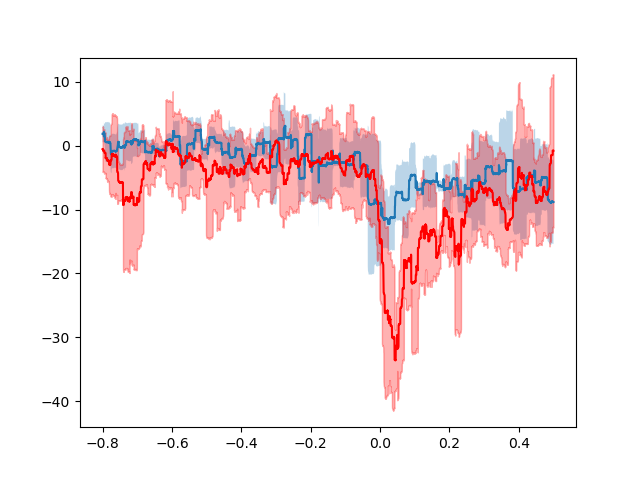

1 fly4_X21_20200420_cell1


<IPython.core.display.Javascript object>


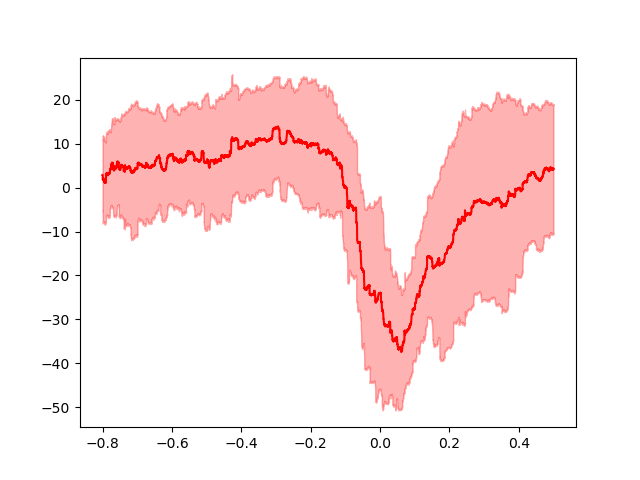

2 fly1_WTCS_20190213_cell1


<IPython.core.display.Javascript object>


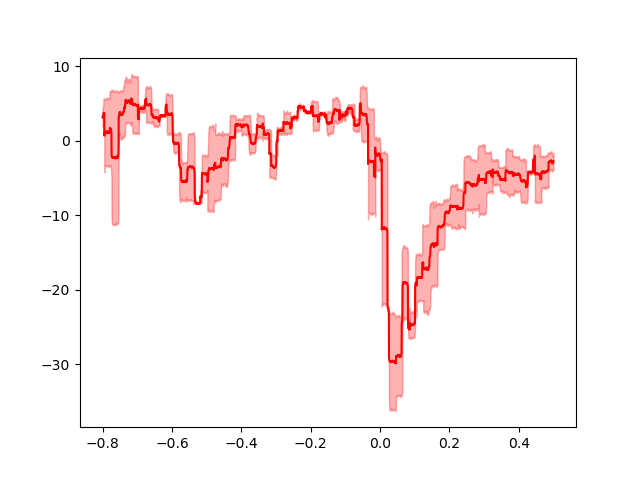

3 fly1_WTCS_20190726_cell1


<IPython.core.display.Javascript object>


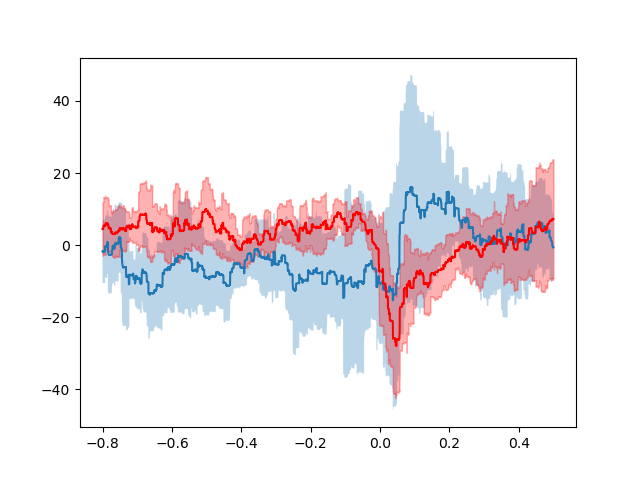

4 fly3_U29xG16_20200129_cell1


<IPython.core.display.Javascript object>


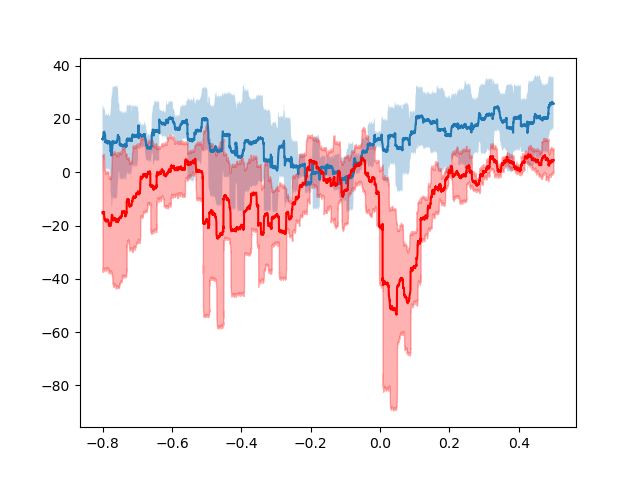

5 fly1_X20a_20200316_cell1


<IPython.core.display.Javascript object>


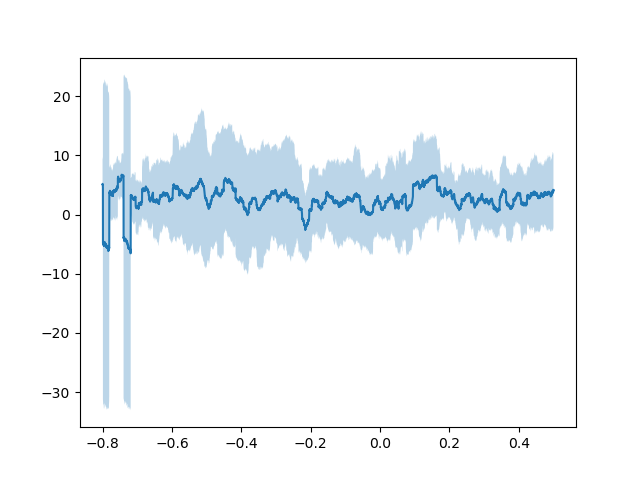

6 fly1_G06xU29_20191104_cell1


<IPython.core.display.Javascript object>


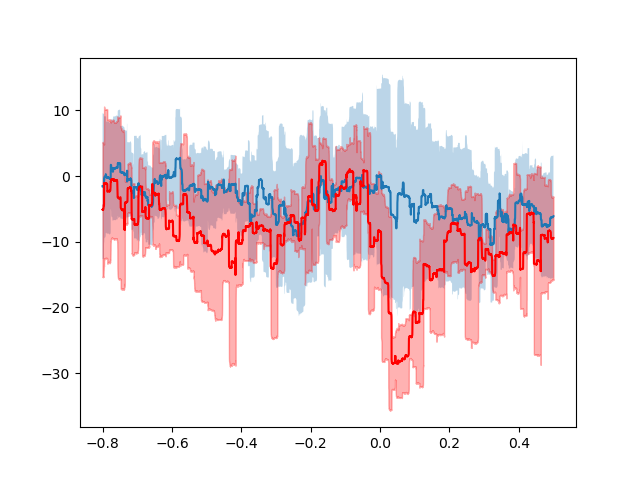

7 fly1_U29xG16_20191209_cell2


<IPython.core.display.Javascript object>


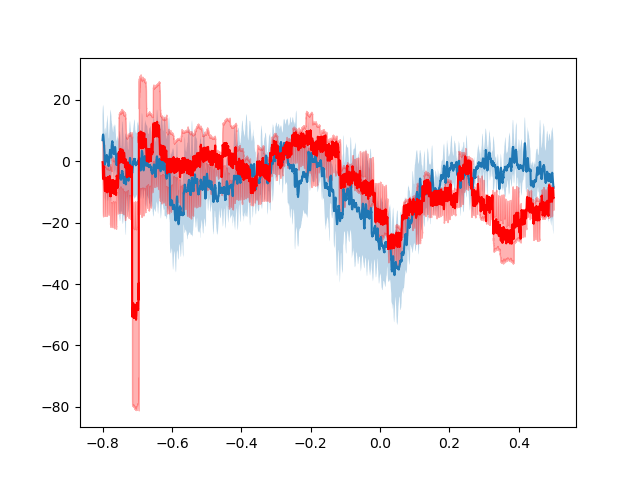

8 fly2_G16xU29_20191025_cell1


<IPython.core.display.Javascript object>


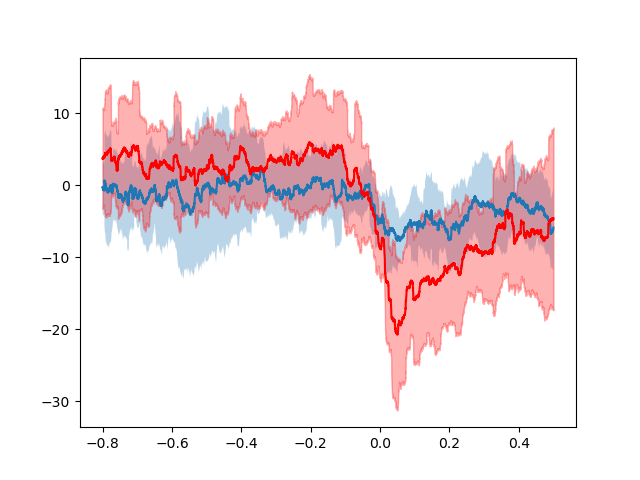

9 fly3_X21_20200415_cell1


<IPython.core.display.Javascript object>


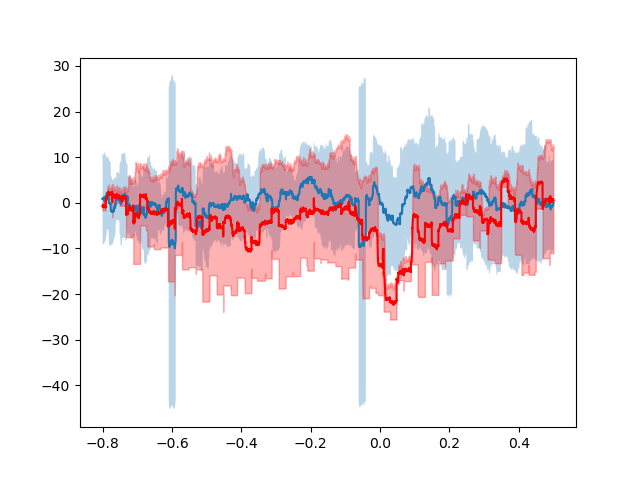

10 fly3_x21_20200417_cell1


<IPython.core.display.Javascript object>


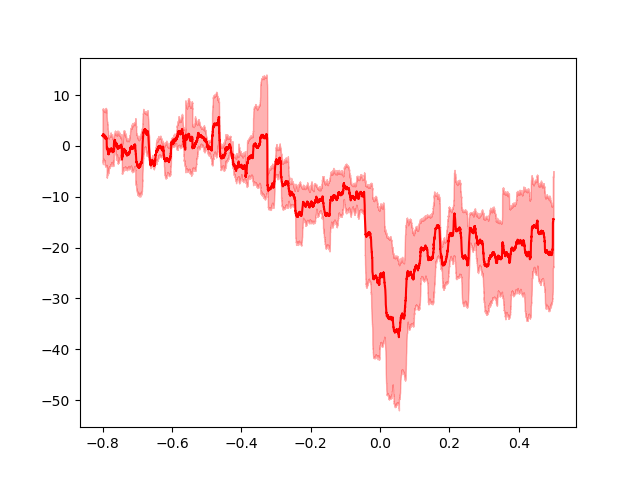

11 fly2_X20_20210217_cell1


<IPython.core.display.Javascript object>


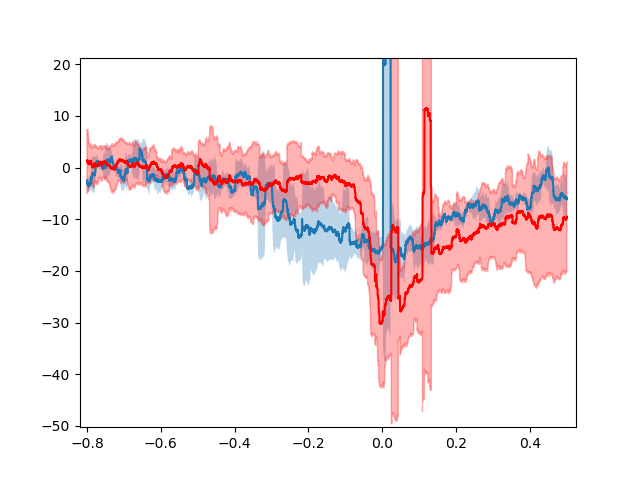

12 fly1_WTCS_20191106_cell1


<IPython.core.display.Javascript object>


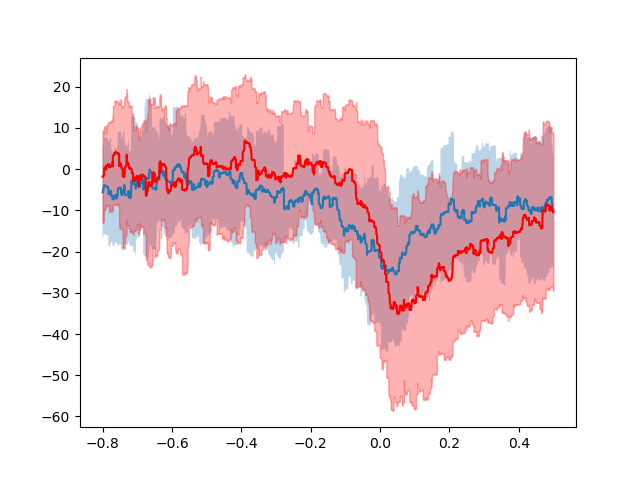

13 fly1_U29xG16_20200129_cell1


<IPython.core.display.Javascript object>


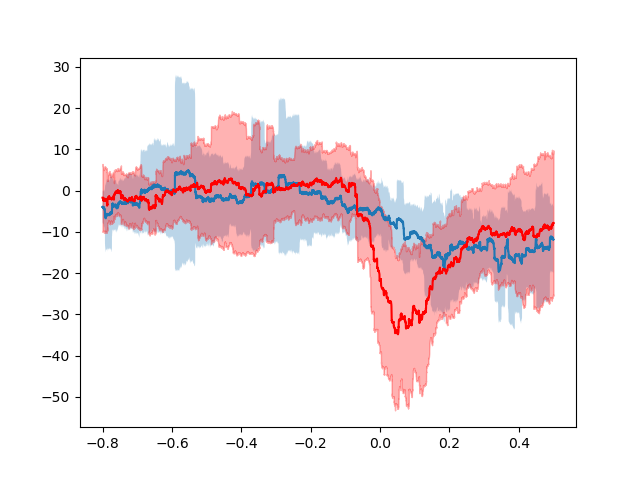

In [19]:
preSacc = 0.8 #s
postSacc = 0.5 #s
maxLoom = (saSacc.preStim+saSacc.stimulusPhases_inframes[1]*saSacc.meanFramePeriod)*saSacc.samplingRate
timeLims = [int(maxLoom-preSacc*saSacc.samplingRate), int(maxLoom+postSacc*saSacc.samplingRate)]
timeSlice = np.arange(timeLims[1]-timeLims[0])/saSacc.samplingRate-preSacc#-saSacc[i].preStim

for flyNo,fly in saSaccBAK.flyID.items():
    print(flyNo, fly)
    saSacc = copy.copy(saSaccBAK)
    remove = np.where(~(saSacc.fly_indices==flyNo))[0]
    saSacc.remove_duds_byList(remove)
    saSacc.average_by_stimSignal()
    
    saStrg = copy.copy(saStrgBAK)
    remove = np.where(~(saStrg.fly_indices==flyNo))[0]
    saStrg.remove_duds_byList(remove)
    saStrg.average_by_stimSignal()
    
    f,ax=plt.subplots(1,1)
    
    try:
        d = saStrg.get_avg_data('wingDiff')
        s = saStrg.get_std_data('wingDiff')

        ax.plot(timeSlice, d[5][timeLims[0]:timeLims[1]]*100.)
        ax.fill_between(timeSlice, 100.*(d[5]+s[5])[timeLims[0]:timeLims[1]], 100.*(d[5]-s[5])[timeLims[0]:timeLims[1]], alpha=0.3)
    except KeyError:
        pass
    try:
        d = saSacc.get_avg_data('wingDiff')
        s = saSacc.get_std_data('wingDiff')
        #d = {k:v*180./np.pi for k,v in d.items()}
        #s = {k:v*180./np.pi for k,v in s.items()}

        ax.plot(timeSlice, d[5][timeLims[0]:timeLims[1]]*100., 'r-')
        ax.fill_between(timeSlice, 100.*(d[5]+s[5])[timeLims[0]:timeLims[1]], 100.*(d[5]-s[5])[timeLims[0]:timeLims[1]], alpha=0.3, color='r')
    except KeyError:
        pass

# Playground

#### compare each wing to ephys separately, cross-correlate

In [223]:
stimgroup=2
trialNo=1
dataset=saSaccade
ephysData=dataset.get_by_group(stimgroup,'ephys')
ephysSmooth = subBandFilter(ephysData[trialNo])
ephysSmooth=stats.zscore(ephysSmooth)
#ephysSmooth /= ephysSmooth.max()

wingLData=dataset.get_by_group(stimgroup,'wingL')
wingLSmooth = subBandFilter(wingLData[trialNo])
wingLSmooth=stats.zscore(wingLSmooth)
#wingLSmooth /= wingLSmooth.max()

wingRData=dataset.get_by_group(stimgroup,'wingR')
wingRSmooth = subBandFilter(wingRData[trialNo])
wingRSmooth=stats.zscore(wingRSmooth)
#wingRSmooth /= np.max(wingRSmooth)

diffData=dataset.get_by_group(stimgroup,'wingDiff')
diffSmooth = subBandFilter(diffData[trialNo])
diffSmooth=stats.zscore(diffSmooth)
#diffSmooth /= np.max(diffSmooth)

#substracting the mean turns it actually into the summed covariance, which we need (and actually mean, *thanks a lot* scipy -_- )
xcor1=signal.correlate(ephysSmooth-ephysSmooth.mean(), wingLSmooth-wingLSmooth.mean())
xcor2=signal.correlate(ephysSmooth-ephysSmooth.mean(), wingRSmooth-wingRSmooth.mean())
xcor3=signal.correlate(ephysSmooth-ephysSmooth.mean(), diffSmooth-diffSmooth.mean())

ephysSigma=ephysSmooth.std()

f,ax=plt.subplots(3,1)
ax[0].plot(ephysSmooth)
ax[0].plot(wingLSmooth)
ax[0].plot(wingRSmooth)
ax[0].plot(diffSmooth)
xcorXax=np.arange(xcor1.size)-xcor1.size//2
#ax[1].plot(xcorXax,signal.correlate(ephysSmooth,ephysSmooth))
#Normalize to Pearson coefficients while plotting
ax[1].plot(xcorXax,xcor1/ephysSmooth.size/ephysSigma/wingLSmooth.std())
ax[1].plot(xcorXax,xcor2/ephysSmooth.size/ephysSigma/wingRSmooth.std())
ax[1].plot(xcorXax,xcor3/ephysSmooth.size/ephysSigma/diffSmooth.std())

ax[2].plot(ephysSmooth*wingLSmooth/wingLSmooth.size)
ax[2].plot(ephysSmooth*wingRSmooth/ephysSmooth.size)
ax[2].plot(ephysSmooth*diffSmooth/ephysSmooth.size)

### analyse distance between curves

In [5]:
f,ax=plt.subplots(1,1)
ax.plot(X[0,:])

NameError: name 'X' is not defined

In [ ]:
# pairwise distance of WBA curves as the difference between them in a relevant time period

window = [45,60]
distance = np.zeros((len(pureYvals), len(pureYvals)))
for i in range(len(pureYvals)):
    for j in range(len(pureYvals)):
        distance[i,j] = np.sum(np.sqrt(np.abs(X[i,window[0]:window[1]] - X[j,window[0]:window[1]])))
    #distance[i,:] = np.sum(X[i,window[0]:window[1]] - X[:,window[0]:window[1]].T, axis=0)

In [144]:
f,ax=plt.subplots(1,1)
#im=ax.pcolormesh(distance, cmap=plt.get_cmap('bwr'))
im=ax.pcolormesh(distance)
plt.colorbar(im)

In [147]:
import sklearn.cluster
km = sklearn.cluster.KMeans(n_clusters=5).fit(distance)
km.labels_

array([1, 2, 3, 1, 2, 2, 4, 1, 2, 1, 1, 1, 4, 2, 1, 2, 2, 2, 2, 1, 2, 2,
       2, 1, 1, 3, 4, 1, 2, 2, 2, 2, 4, 2, 1, 4, 0, 1, 2, 1, 2, 1, 1, 4,
       1, 2, 1, 2, 1, 1, 1, 1, 3, 1, 3, 1, 3, 2, 3, 0, 2, 1, 1, 0, 3, 1,
       1, 2, 2, 1, 2, 2, 2, 3, 1, 1, 3, 3, 3, 3, 1, 2, 1, 1, 1, 1, 2, 1,
       2, 3, 2, 2, 1, 2, 2, 2, 2, 2, 1, 2, 4, 3, 4, 1, 2, 1, 1, 1, 1, 2,
       4, 1, 4, 3, 2, 2, 2, 2, 1, 2, 2, 1, 4, 1, 2, 2, 1, 2, 1, 0, 4, 2,
       4, 2, 3, 4, 2, 1, 2, 3, 1, 3, 1, 1, 2, 1, 2, 2, 1, 4, 4, 1, 4, 4,
       4, 3, 3, 1, 1, 0, 3, 4, 2, 2, 0, 4, 1, 0, 4, 0, 4, 2, 0, 0, 4, 2,
       1, 1, 4, 4, 0, 0, 4, 2, 4, 4, 0, 4, 0, 4, 4, 0, 0, 4, 2, 0, 4, 2,
       2, 2, 4, 2, 0, 4, 4, 2, 2, 4, 4, 4, 4, 2, 4, 0, 4, 4, 4, 4, 0, 2,
       0, 0, 0, 0, 4, 2, 4, 4, 2, 4, 4, 4, 2, 2, 0, 2, 0, 4, 4, 2, 4, 4,
       1, 2, 2, 0, 4, 0, 4, 0, 4, 4, 4, 4, 0, 4, 4, 0, 0, 1, 4, 4, 0, 0,
       0, 4, 2, 2, 0, 0, 0, 4, 4, 0, 0, 0, 4, 4, 0, 4, 4, 4, 4, 0, 2, 2,
       4, 4, 4, 2, 4, 4, 2, 0, 2, 2, 0, 2, 0, 2, 4,

In [167]:
#colors=np.array(['b','r','g','k','y'])
f,ax=plt.subplots(3,2)
ax=ax.flatten()
#ax.pcolormesh(distance[idx])
for i in range(km.labels_.max()+1):
    ax[i].plot(X[km.labels_==i].T)
    ax[i].plot(np.mean(X[km.labels_==i],axis=0), 'k')

### K-means clustering of PCA transformed values

In [ ]:
#np.savez('D:/RecorderData/PCA_dimensions', evecs,evals)
with np.load('D:/RecorderData/PCA_dimensions.npz') as data:
    evecs=data['arr_0']
    evals=data['arr_1']

<IPython.core.display.Javascript object>


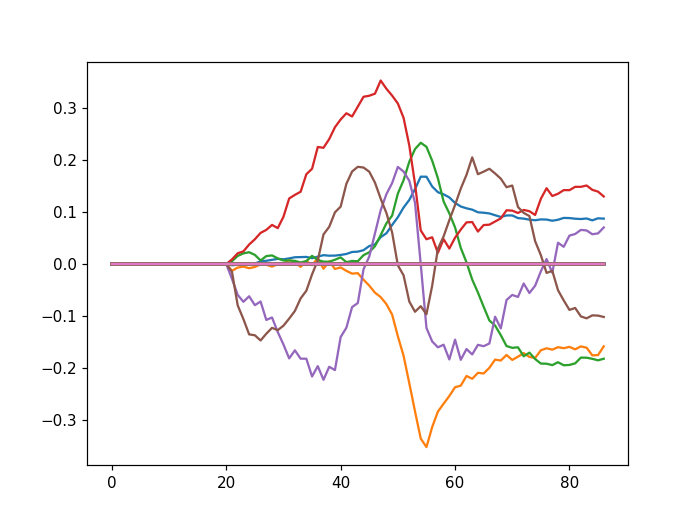

In [94]:
# Parenthesis: modify dimensions and set the bump at beginning to 0
newDims = np.zeros_like(evecs)
for i in range(6):
    new = evecs[:,i]
    module = new[20]
    new[:20] = module
    new -= module
    newDims[:,i] = new
f,ax=plt.subplots(1,1)
ax.plot(newDims)

In [95]:
nDims = 3
Snew = X @ newDims

<IPython.core.display.Javascript object>


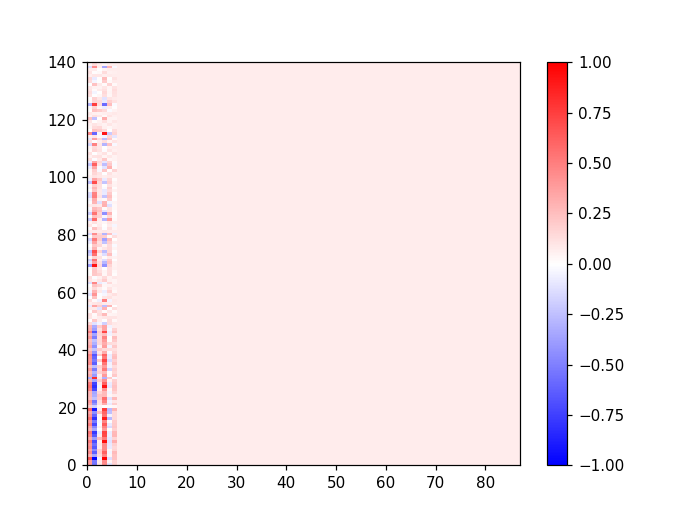

In [96]:
f,ax=plt.subplots(1,1)
ax.pcolormesh(Snew, cmap=plt.get_cmap('bwr'))
plt.colorbar(im)
im.set_clim([-1,1])

In [91]:
import sklearn.cluster

In [92]:
km = sklearn.cluster.KMeans(n_clusters=nDims*2).fit(Snew[:,:nDims])
np.histogram(km.labels_, np.arange(-0.5, km.labels_.max()+1,1))

(array([40, 27, 51, 32, 26, 68], dtype=int64),
 array([-0.5,  0.5,  1.5,  2.5,  3.5,  4.5,  5.5]))

<IPython.core.display.Javascript object>


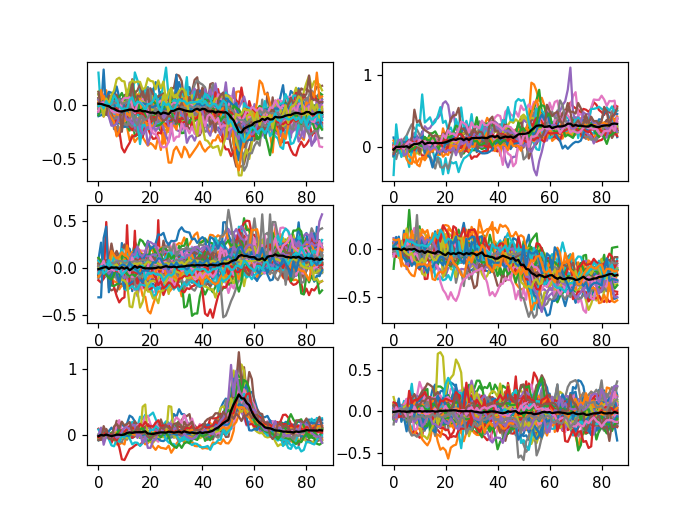

In [93]:
f,ax=plt.subplots(3,2)
ax=ax.flatten()
for i in range(km.labels_.max()+1):
    ax[i].plot(X[km.labels_==i].T)
    ax[i].plot(np.mean(X[km.labels_==i],axis=0), 'k')
    #[ax[i].plot(s.data[-1]) for s in saFly.segments[km.labels_==i]  ] #just as confusing
    

Not even half-bad. This might actually be something meaningful. Compare it ot other methods at some point.